In [1]:
import pandas as pd
import csv
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import geopandas as gpd

In [3]:
import statsmodels.api as sm
import networkx as nx
from pyvis.network import Network

In [4]:
map_df = gpd.read_file('LAD_APR_2019_UK_BUC.shp')
keep = ["E"]
map_df = map_df[map_df['LAD19CD'].str.contains('|'.join(keep))]

In [5]:
map_df['Centroid'] = map_df['geometry'].centroid

In [6]:
cities_df = gpd.read_file('TCITY_2015_EW_BGG_V2.shp')

In [7]:
all_waves =pd.read_csv('all_waves.csv')

In [292]:
all_waves

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave
0,Redcar and Cleveland,East Devon,0.597890,6.0,Rural-Rural,True,446.686187,1st
1,Redcar and Cleveland,Havant,0.705012,-6.0,Rural-Rural,True,411.943769,1st
2,Redcar and Cleveland,Surrey Heath,0.610272,-6.0,Rural-Rural,True,357.783404,1st
3,Redcar and Cleveland,Worthing,0.618926,-6.0,Urban-Rural,True,416.062959,1st
4,Redcar and Cleveland,Bolton,0.696269,9.0,Urban-Rural,False,143.901356,1st
...,...,...,...,...,...,...,...,...
147418,Basingstoke and Deane,Rushcliffe,0.917484,0.0,Rural-Rural,True,181.384385,3rd
147419,Basingstoke and Deane,Hillingdon,0.906936,0.0,Urban-Rural,False,60.445984,3rd
147420,Tunbridge Wells,Rushcliffe,0.903993,0.0,Rural-Rural,True,222.863872,3rd
147421,Tunbridge Wells,Hillingdon,0.868682,0.0,Urban-Rural,False,77.442951,3rd


# 1st Wave

In [9]:
firstwave = all_waves.loc[all_waves['Wave'] == '1st']

In [10]:
firstwave_lag = firstwave.loc[(firstwave['Maximum Correlation'] > 0.6621) & (firstwave['Lag in Days'] <= 21) & (firstwave['Lag in Days'] >= -21)]

In [11]:
firstwave_lag

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave
1,Redcar and Cleveland,Havant,0.705012,-6.0,Rural-Rural,True,411.943769,1st
4,Redcar and Cleveland,Bolton,0.696269,9.0,Urban-Rural,False,143.901356,1st
9,Redcar and Cleveland,Hounslow,0.704785,-10.0,Urban-Rural,True,345.836353,1st
10,Redcar and Cleveland,Wandsworth,0.690571,-21.0,Urban-Rural,True,349.363988,1st
14,Redcar and Cleveland,Winchester,0.719156,-6.0,Rural-Rural,True,392.248522,1st
...,...,...,...,...,...,...,...,...
49122,County Durham,Basingstoke and Deane,0.726992,-7.0,Rural-Rural,True,383.162331,1st
49125,County Durham,Hillingdon,0.824759,-15.0,Urban-Rural,True,363.055895,1st
49131,Colchester,Basingstoke and Deane,0.679860,-21.0,Urban-Rural,True,157.684476,1st
49134,Colchester,Hillingdon,0.743909,-18.0,Urban-Urban,False,97.470539,1st


In [12]:
ltla2region = pd.read_csv('ltla2region.csv')

In [13]:
firstwave_lag = firstwave_lag.merge(ltla2region, how='left', left_on='LTLA 1', right_on='LAD19NM')
firstwave_lag = firstwave_lag.merge(ltla2region, how='left', left_on='LTLA 2', right_on='LAD19NM')
firstwave_lag

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave,Unnamed: 0_x,LAD19NM_x,RGN19NM_x,Colour_x,Unnamed: 0_y,LAD19NM_y,RGN19NM_y,Colour_y
0,Redcar and Cleveland,Havant,0.705012,-6.0,Rural-Rural,True,411.943769,1st,176,Redcar and Cleveland,North East,cyan,237,Havant,South East,green
1,Redcar and Cleveland,Bolton,0.696269,9.0,Urban-Rural,False,143.901356,1st,176,Redcar and Cleveland,North East,cyan,70,Bolton,North West,black
2,Redcar and Cleveland,Hounslow,0.704785,-10.0,Urban-Rural,True,345.836353,1st,176,Redcar and Cleveland,North East,cyan,26,Hounslow,London,red
3,Redcar and Cleveland,Wandsworth,0.690571,-21.0,Urban-Rural,True,349.363988,1st,176,Redcar and Cleveland,North East,cyan,64,Wandsworth,London,red
4,Redcar and Cleveland,Winchester,0.719156,-6.0,Rural-Rural,True,392.248522,1st,176,Redcar and Cleveland,North East,cyan,241,Winchester,South East,green
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11613,County Durham,Basingstoke and Deane,0.726992,-7.0,Rural-Rural,True,383.162331,1st,179,County Durham,North East,cyan,231,Basingstoke and Deane,South East,green
11614,County Durham,Hillingdon,0.824759,-15.0,Urban-Rural,True,363.055895,1st,179,County Durham,North East,cyan,25,Hillingdon,London,red
11615,Colchester,Basingstoke and Deane,0.679860,-21.0,Urban-Rural,True,157.684476,1st,218,Colchester,East of England,orange,231,Basingstoke and Deane,South East,green
11616,Colchester,Hillingdon,0.743909,-18.0,Urban-Urban,False,97.470539,1st,218,Colchester,East of England,orange,25,Hillingdon,London,red


In [14]:
firstwave_lag = firstwave_lag.drop(columns=['Unnamed: 0_x', 'LAD19NM_x', 'Colour_x', 'Unnamed: 0_y', 'LAD19NM_y', 'Colour_y'])
firstwave_lag = firstwave_lag.rename(columns={'RGN19NM_x':'LTLA 1 Region', 'RGN19NM_y':'LTLA 2 Region'})
firstwave_lag

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave,LTLA 1 Region,LTLA 2 Region
0,Redcar and Cleveland,Havant,0.705012,-6.0,Rural-Rural,True,411.943769,1st,North East,South East
1,Redcar and Cleveland,Bolton,0.696269,9.0,Urban-Rural,False,143.901356,1st,North East,North West
2,Redcar and Cleveland,Hounslow,0.704785,-10.0,Urban-Rural,True,345.836353,1st,North East,London
3,Redcar and Cleveland,Wandsworth,0.690571,-21.0,Urban-Rural,True,349.363988,1st,North East,London
4,Redcar and Cleveland,Winchester,0.719156,-6.0,Rural-Rural,True,392.248522,1st,North East,South East
...,...,...,...,...,...,...,...,...,...,...
11613,County Durham,Basingstoke and Deane,0.726992,-7.0,Rural-Rural,True,383.162331,1st,North East,South East
11614,County Durham,Hillingdon,0.824759,-15.0,Urban-Rural,True,363.055895,1st,North East,London
11615,Colchester,Basingstoke and Deane,0.679860,-21.0,Urban-Rural,True,157.684476,1st,East of England,South East
11616,Colchester,Hillingdon,0.743909,-18.0,Urban-Urban,False,97.470539,1st,East of England,London


In [15]:
firstwave_rep = firstwave_lag.drop(columns=['Distance > 150km?'])

In [16]:
firstwave_rep2 = firstwave.drop(columns=['Distance > 150km?'])

In [210]:
def lag_direction(df1, df2):
    

    for i in range(len(df1)):
    
        if int(df1['Lag in Days'].iloc[i]) < 0:
    
     
            df1['LTLA 1'].iloc[i] = df2['LTLA 2'].iloc[i]
            df1['LTLA 2'].iloc[i] = df2['LTLA 1'].iloc[i]
    
    return df1
        

In [18]:
firstwave_lagnew = lag_direction(firstwave_lag, firstwave_rep)

/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/1245444803.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['LTLA 1'].iloc[i] = df2['LTLA 2'].iloc[i]
/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/1245444803.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['LTLA 2'].iloc[i] = df2['LTLA 1'].iloc[i]


In [20]:
firstwave_new = lag_direction(firstwave, firstwave_rep2)

/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/1245444803.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['LTLA 1'].iloc[i] = df2['LTLA 2'].iloc[i]
/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/1245444803.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['LTLA 2'].iloc[i] = df2['LTLA 1'].iloc[i]


In [21]:
firstwave_lagnew['Lag in Days'] = abs(firstwave_lagnew['Lag in Days'])

In [22]:
firstwave_new['Lag in Days'] = abs(firstwave_new['Lag in Days'])

/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/891641378.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  firstwave_new['Lag in Days'] = abs(firstwave_new['Lag in Days'])


In [23]:
firstwave_lagnew = firstwave_lagnew.drop(columns=['LTLA 1 Region', 'LTLA 2 Region'])


In [24]:
firstwave_new

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave
0,Redcar and Cleveland,East Devon,0.597890,6.0,Rural-Rural,True,446.686187,1st
1,Havant,Redcar and Cleveland,0.705012,6.0,Rural-Rural,True,411.943769,1st
2,Surrey Heath,Redcar and Cleveland,0.610272,6.0,Rural-Rural,True,357.783404,1st
3,Worthing,Redcar and Cleveland,0.618926,6.0,Urban-Rural,True,416.062959,1st
4,Redcar and Cleveland,Bolton,0.696269,9.0,Urban-Rural,False,143.901356,1st
...,...,...,...,...,...,...,...,...
49136,Basingstoke and Deane,Rushcliffe,0.476345,6.0,Rural-Rural,True,181.384385,1st
49137,Hillingdon,Basingstoke and Deane,0.750190,3.0,Urban-Rural,False,60.445984,1st
49138,Rushcliffe,Tunbridge Wells,0.382597,7.0,Rural-Rural,True,222.863872,1st
49139,Hillingdon,Tunbridge Wells,0.413961,47.0,Urban-Rural,False,77.442951,1st


In [25]:
firstwave_lagnew = firstwave_lagnew.merge(ltla2region, how='left', left_on='LTLA 1', right_on='LAD19NM')
firstwave_lagnew = firstwave_lagnew.merge(ltla2region, how='left', left_on='LTLA 2', right_on='LAD19NM')

In [26]:
firstwave_new = firstwave_new.merge(ltla2region, how='left', left_on='LTLA 1', right_on='LAD19NM')
firstwave_new = firstwave_new.merge(ltla2region, how='left', left_on='LTLA 2', right_on='LAD19NM')

In [27]:
firstwave_lagnew = firstwave_lagnew.drop(columns=['Unnamed: 0_x', 'LAD19NM_x', 'Colour_x', 'Unnamed: 0_y', 'LAD19NM_y', 'Colour_y'])
firstwave_lagnew = firstwave_lagnew.rename(columns={'RGN19NM_x':'LTLA 1 Region', 'RGN19NM_y':'LTLA 2 Region'})
firstwave_lagnew

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave,LTLA 1 Region,LTLA 2 Region
0,Havant,Redcar and Cleveland,0.705012,6.0,Rural-Rural,True,411.943769,1st,South East,North East
1,Redcar and Cleveland,Bolton,0.696269,9.0,Urban-Rural,False,143.901356,1st,North East,North West
2,Hounslow,Redcar and Cleveland,0.704785,10.0,Urban-Rural,True,345.836353,1st,London,North East
3,Wandsworth,Redcar and Cleveland,0.690571,21.0,Urban-Rural,True,349.363988,1st,London,North East
4,Winchester,Redcar and Cleveland,0.719156,6.0,Rural-Rural,True,392.248522,1st,South East,North East
...,...,...,...,...,...,...,...,...,...,...
11613,Basingstoke and Deane,County Durham,0.726992,7.0,Rural-Rural,True,383.162331,1st,South East,North East
11614,Hillingdon,County Durham,0.824759,15.0,Urban-Rural,True,363.055895,1st,London,North East
11615,Basingstoke and Deane,Colchester,0.679860,21.0,Urban-Rural,True,157.684476,1st,South East,East of England
11616,Hillingdon,Colchester,0.743909,18.0,Urban-Urban,False,97.470539,1st,London,East of England


In [28]:
firstwave_new = firstwave_new.drop(columns=['Unnamed: 0_x', 'LAD19NM_x', 'Colour_x', 'Unnamed: 0_y', 'LAD19NM_y', 'Colour_y'])
firstwave_new = firstwave_new.rename(columns={'RGN19NM_x':'LTLA 1 Region', 'RGN19NM_y':'LTLA 2 Region'})

In [29]:
firstwave_lagnew["LTLA Regions"] = firstwave_lagnew['LTLA 1 Region'].astype(str) +"-"+ firstwave_lagnew["LTLA 2 Region"]
firstwave_lagnew

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave,LTLA 1 Region,LTLA 2 Region,LTLA Regions
0,Havant,Redcar and Cleveland,0.705012,6.0,Rural-Rural,True,411.943769,1st,South East,North East,South East-North East
1,Redcar and Cleveland,Bolton,0.696269,9.0,Urban-Rural,False,143.901356,1st,North East,North West,North East-North West
2,Hounslow,Redcar and Cleveland,0.704785,10.0,Urban-Rural,True,345.836353,1st,London,North East,London-North East
3,Wandsworth,Redcar and Cleveland,0.690571,21.0,Urban-Rural,True,349.363988,1st,London,North East,London-North East
4,Winchester,Redcar and Cleveland,0.719156,6.0,Rural-Rural,True,392.248522,1st,South East,North East,South East-North East
...,...,...,...,...,...,...,...,...,...,...,...
11613,Basingstoke and Deane,County Durham,0.726992,7.0,Rural-Rural,True,383.162331,1st,South East,North East,South East-North East
11614,Hillingdon,County Durham,0.824759,15.0,Urban-Rural,True,363.055895,1st,London,North East,London-North East
11615,Basingstoke and Deane,Colchester,0.679860,21.0,Urban-Rural,True,157.684476,1st,South East,East of England,South East-East of England
11616,Hillingdon,Colchester,0.743909,18.0,Urban-Urban,False,97.470539,1st,London,East of England,London-East of England


In [30]:
firstwave_new

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave,LTLA 1 Region,LTLA 2 Region
0,Redcar and Cleveland,East Devon,0.597890,6.0,Rural-Rural,True,446.686187,1st,North East,South West
1,Havant,Redcar and Cleveland,0.705012,6.0,Rural-Rural,True,411.943769,1st,South East,North East
2,Surrey Heath,Redcar and Cleveland,0.610272,6.0,Rural-Rural,True,357.783404,1st,South East,North East
3,Worthing,Redcar and Cleveland,0.618926,6.0,Urban-Rural,True,416.062959,1st,South East,North East
4,Redcar and Cleveland,Bolton,0.696269,9.0,Urban-Rural,False,143.901356,1st,North East,North West
...,...,...,...,...,...,...,...,...,...,...
49136,Basingstoke and Deane,Rushcliffe,0.476345,6.0,Rural-Rural,True,181.384385,1st,South East,East Midlands
49137,Hillingdon,Basingstoke and Deane,0.750190,3.0,Urban-Rural,False,60.445984,1st,London,South East
49138,Rushcliffe,Tunbridge Wells,0.382597,7.0,Rural-Rural,True,222.863872,1st,East Midlands,South East
49139,Hillingdon,Tunbridge Wells,0.413961,47.0,Urban-Rural,False,77.442951,1st,London,South East


In [31]:
firstwave_new["LTLA Regions"] = firstwave_new['LTLA 1 Region'].astype(str) +"-"+ firstwave_new["LTLA 2 Region"]

In [32]:
firstwave_lagnew['LTLA Regions'].value_counts()

London-South East                      910
London-London                          463
London-North West                      460
London-East of England                 459
South East-South East                  422
                                      ... 
East Midlands-West Midlands             21
Yorkshire and The Humber-South West     21
Yorkshire and The Humber-London         13
East Midlands-East Midlands              5
East Midlands-London                     5
Name: LTLA Regions, Length: 81, dtype: int64

In [33]:
grouped = firstwave_new.groupby(['LTLA 1 Region', 'LTLA 2 Region'])

correlation_means2 = grouped.mean()

In [34]:
grouped3 = firstwave_lagnew.groupby(['LTLA 1 Region', 'LTLA 2 Region'])

region_meanslag = grouped3.mean()

In [35]:
region_meanslag = region_meanslag.reset_index()

In [36]:
correlation_means2test = correlation_means2.reset_index()
correlation_means2test

,LTLA 1 Region,LTLA 2 Region,Maximum Correlation,Lag in Days,Distance > 150km?,Distance between centroids
0,East Midlands,East Midlands,0.434389,10.652564,0.001282,60.434507
1,East Midlands,East of England,0.499405,6.035156,0.501953,145.735584
2,East Midlands,London,0.528525,2.864407,0.813559,168.365156
3,East Midlands,North East,0.538516,4.116438,0.965753,210.381317
4,East Midlands,North West,0.472796,12.813913,0.401739,142.005793
...,...,...,...,...,...,...
76,Yorkshire and The Humber,North West,0.522305,16.221402,0.166052,99.867754
77,Yorkshire and The Humber,South East,0.550518,6.624625,1.000000,305.627420
78,Yorkshire and The Humber,South West,0.532503,7.301075,1.000000,327.330385
79,Yorkshire and The Humber,West Midlands,0.568405,6.294872,0.532051,153.127275


In [37]:
region_means2 = correlation_means2test

In [38]:
grouped2 = firstwave_new.groupby('LTLA Regions')

correlation_means = grouped2.mean()

In [39]:
correlation_means.nlargest(10,'Maximum Correlation')

,Maximum Correlation,Lag in Days,Distance > 150km?,Distance between centroids
LTLA Regions,,,,
London-London,0.815675,2.838710,0.000000,18.185063
North East-London,0.812831,1.727273,1.000000,394.035411
North East-North East,0.749894,2.954545,0.000000,39.878912
London-North East,0.749178,10.062857,1.000000,377.963266
North West-London,0.695682,4.776119,1.000000,350.852064
West Midlands-North East,0.677431,5.329730,1.000000,255.748196
West Midlands-London,0.671852,4.271930,0.763158,166.294103
South East-London,0.668945,3.162791,0.000000,45.943200
South East-North East,0.664800,4.928571,1.000000,397.658767


In [40]:
region_means = correlation_means.drop(columns = ['Distance > 150km?'])
region_means

,Maximum Correlation,Lag in Days,Distance between centroids
LTLA Regions,,,
East Midlands-East Midlands,0.434389,10.652564,60.434507
East Midlands-East of England,0.499405,6.035156,145.735584
East Midlands-London,0.528525,2.864407,168.365156
East Midlands-North East,0.538516,4.116438,210.381317
East Midlands-North West,0.472796,12.813913,142.005793
...,...,...,...
Yorkshire and The Humber-North West,0.522305,16.221402,99.867754
Yorkshire and The Humber-South East,0.550518,6.624625,305.627420
Yorkshire and The Humber-South West,0.532503,7.301075,327.330385


In [41]:
firstwave_new

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave,LTLA 1 Region,LTLA 2 Region,LTLA Regions
0,Redcar and Cleveland,East Devon,0.597890,6.0,Rural-Rural,True,446.686187,1st,North East,South West,North East-South West
1,Havant,Redcar and Cleveland,0.705012,6.0,Rural-Rural,True,411.943769,1st,South East,North East,South East-North East
2,Surrey Heath,Redcar and Cleveland,0.610272,6.0,Rural-Rural,True,357.783404,1st,South East,North East,South East-North East
3,Worthing,Redcar and Cleveland,0.618926,6.0,Urban-Rural,True,416.062959,1st,South East,North East,South East-North East
4,Redcar and Cleveland,Bolton,0.696269,9.0,Urban-Rural,False,143.901356,1st,North East,North West,North East-North West
...,...,...,...,...,...,...,...,...,...,...,...
49136,Basingstoke and Deane,Rushcliffe,0.476345,6.0,Rural-Rural,True,181.384385,1st,South East,East Midlands,South East-East Midlands
49137,Hillingdon,Basingstoke and Deane,0.750190,3.0,Urban-Rural,False,60.445984,1st,London,South East,London-South East
49138,Rushcliffe,Tunbridge Wells,0.382597,7.0,Rural-Rural,True,222.863872,1st,East Midlands,South East,East Midlands-South East
49139,Hillingdon,Tunbridge Wells,0.413961,47.0,Urban-Rural,False,77.442951,1st,London,South East,London-South East


In [47]:
median_by_region = firstwave_new.groupby(['LTLA Regions'])['Maximum Correlation'].median().sort_values(ascending=False)


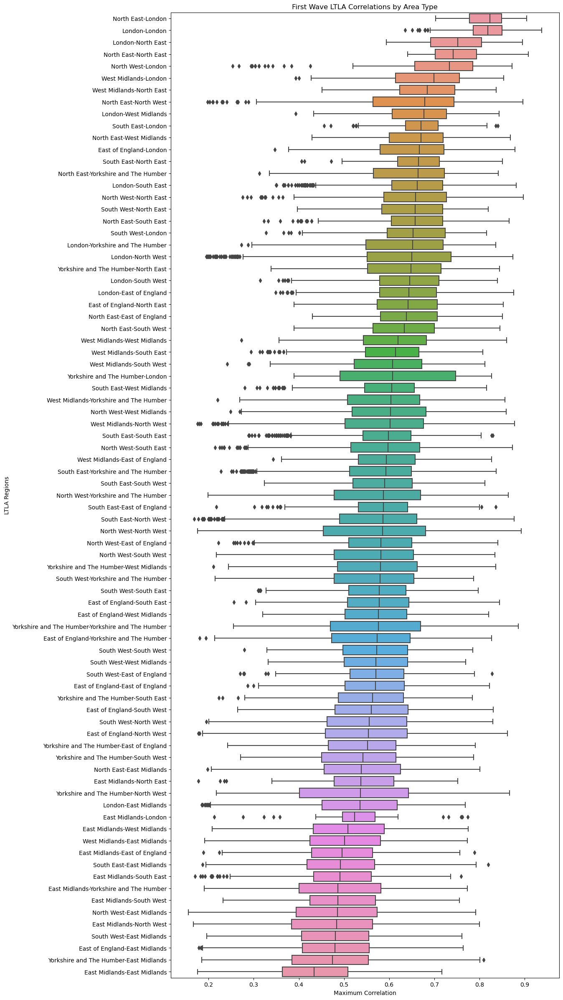

In [48]:
plt.figure(figsize=(12,30))
sns.boxplot(x=firstwave_new['Maximum Correlation'], y= firstwave_new['LTLA Regions'], order = median_by_region.index)
plt.title('First Wave LTLA Correlations by Area Type')
plt.show()

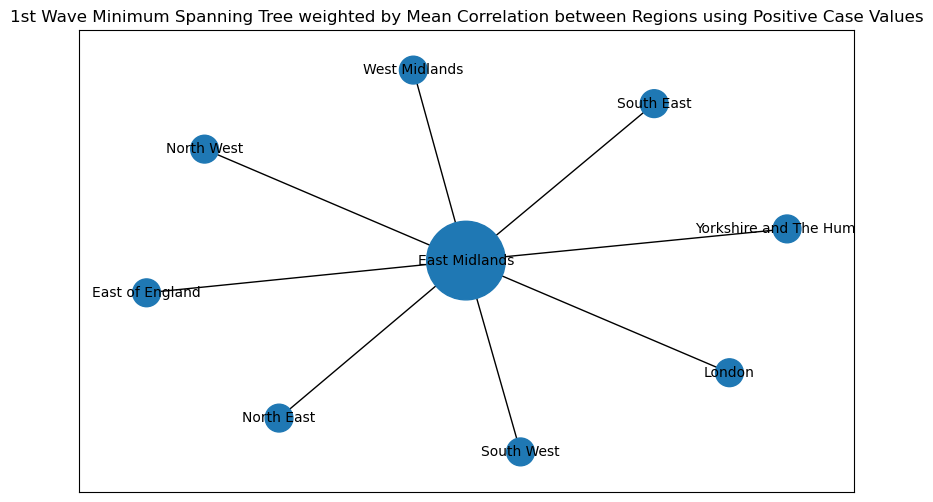

In [49]:
G = nx.from_pandas_edgelist(region_means2,'LTLA 1 Region','LTLA 2 Region', edge_attr='Maximum Correlation')
T = nx.minimum_spanning_tree(G, weight = 'Maximum Correlation')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(T.nodes).keys()]
labels = {i:i for i in dict(T.nodes).keys()}


d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 400 for x in degree_values]

fig, ax = plt.subplots(figsize=(10,6))
pos = nx.spring_layout(T)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 10, ax=ax)

plt.title('1st Wave Minimum Spanning Tree weighted by Mean Correlation between Regions using Positive Case Values')
plt.show()

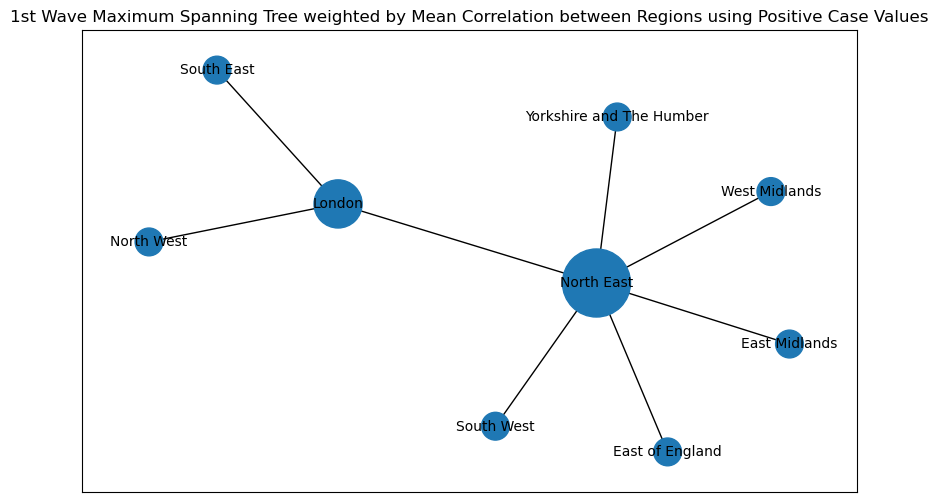

In [89]:
G = nx.from_pandas_edgelist(region_means2,'LTLA 1 Region','LTLA 2 Region', edge_attr='Maximum Correlation')
T = nx.maximum_spanning_tree(G, weight = 'Maximum Correlation')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(T.nodes).keys()]
labels = {i:i for i in dict(T.nodes).keys()}



d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 400 for x in degree_values]

fig, ax = plt.subplots(figsize=(10,6))
pos = nx.spring_layout(T)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 10, ax=ax)

plt.title('1st Wave Maximum Spanning Tree weighted by Mean Correlation between Regions using Positive Case Values')
plt.show()

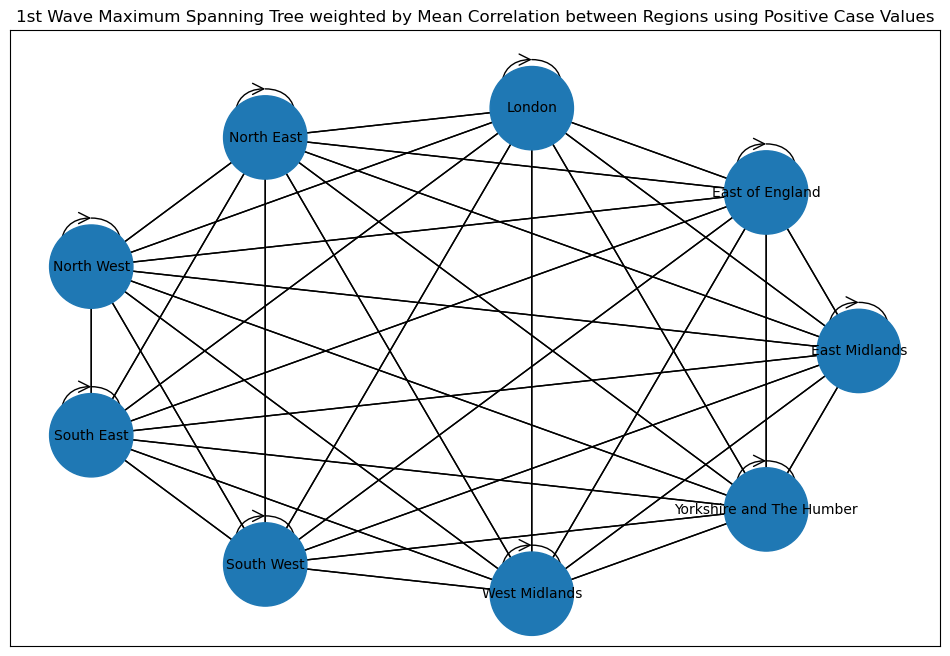

In [188]:
G = nx.from_pandas_edgelist(region_means2,source = 'LTLA 1 Region',target = 'LTLA 2 Region', edge_attr='Maximum Correlation', create_using = nx.DiGraph())

#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}



d = G.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 200 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,8))
pos = nx.circular_layout(G)
nx.draw_networkx_nodes(G, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(G, pos, arrowstyle="->",arrowsize = 20, ax=ax)
nx.draw_networkx_labels(G, pos, labels, font_size = 10, ax=ax)

plt.title('1st Wave Maximum Spanning Tree weighted by Mean Correlation between Regions using Positive Case Values')
plt.show()

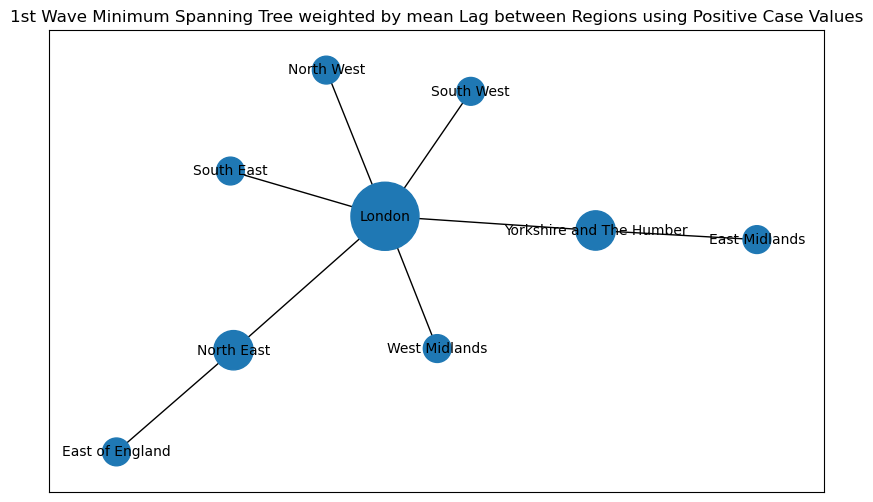

In [90]:
G = nx.from_pandas_edgelist(region_means2,'LTLA 1 Region','LTLA 2 Region', edge_attr='Lag in Days')
T = nx.minimum_spanning_tree(G, weight = 'Lag in Days')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(T.nodes).keys()]
labels = {i:i for i in dict(T.nodes).keys()}


d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 400 for x in degree_values]

fig, ax = plt.subplots(figsize=(10,6))
pos = nx.spring_layout(T)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 10, ax=ax)

plt.title('1st Wave Minimum Spanning Tree weighted by mean Lag between Regions using Positive Case Values')
plt.show()

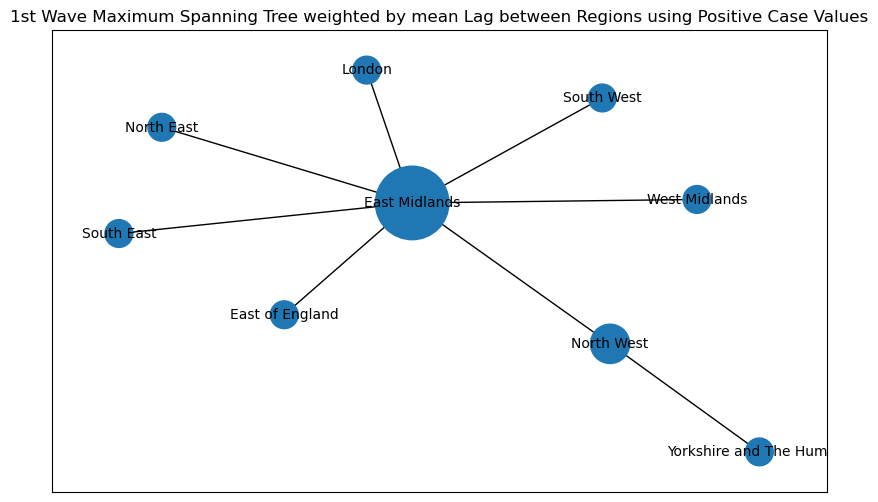

In [91]:
G = nx.from_pandas_edgelist(region_means2,'LTLA 1 Region','LTLA 2 Region', edge_attr='Lag in Days')
T = nx.maximum_spanning_tree(G, weight = 'Lag in Days')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(T.nodes).keys()]
labels = {i:i for i in dict(T.nodes).keys()}


d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 400 for x in degree_values]

fig, ax = plt.subplots(figsize=(10,6))
pos = nx.spring_layout(T)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 10, ax=ax)

plt.title('1st Wave Maximum Spanning Tree weighted by mean Lag between Regions using Positive Case Values')
plt.show()

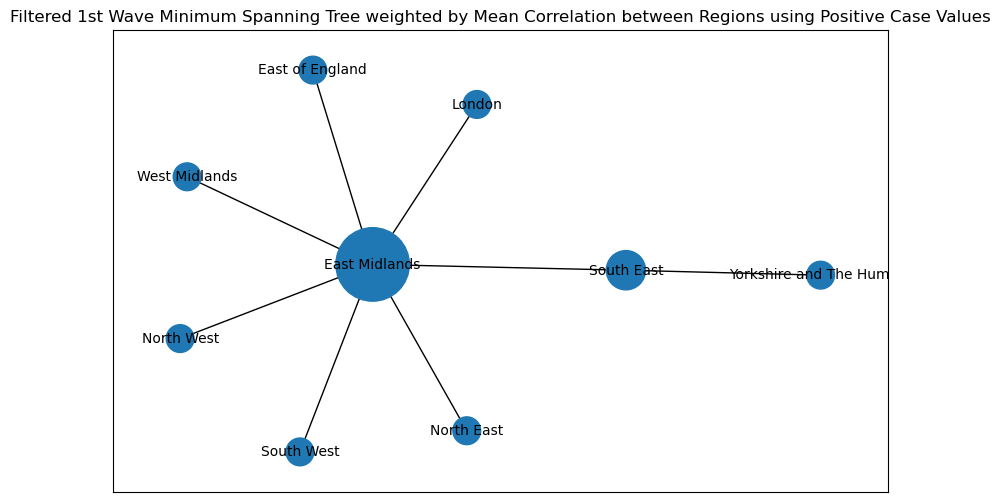

In [98]:
G = nx.from_pandas_edgelist(region_meanslag,'LTLA 1 Region','LTLA 2 Region', edge_attr='Maximum Correlation')
T = nx.minimum_spanning_tree(G, weight = 'Maximum Correlation')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(T.nodes).keys()]
labels = {i:i for i in dict(T.nodes).keys()}


d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 400 for x in degree_values]

fig, ax = plt.subplots(figsize=(10,6))
pos = nx.spring_layout(T)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 10, ax=ax)

plt.title('Filtered 1st Wave Minimum Spanning Tree weighted by Mean Correlation between Regions using Positive Case Values')
plt.show()

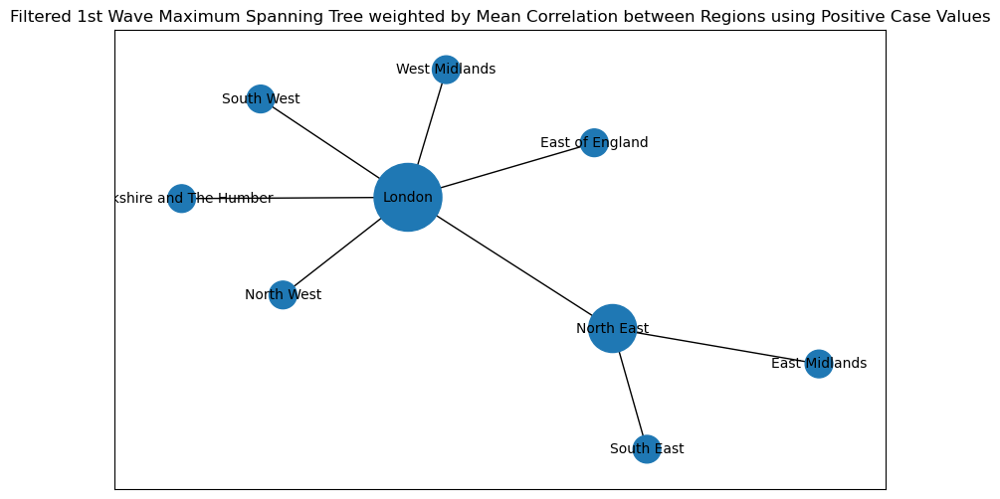

In [97]:
G = nx.from_pandas_edgelist(region_meanslag,'LTLA 1 Region','LTLA 2 Region', edge_attr='Maximum Correlation')
T = nx.maximum_spanning_tree(G, weight = 'Maximum Correlation')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(T.nodes).keys()]
labels = {i:i for i in dict(T.nodes).keys()}


d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 400 for x in degree_values]

fig, ax = plt.subplots(figsize=(10,6))
pos = nx.spring_layout(T)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 10, ax=ax)

plt.title('Filtered 1st Wave Maximum Spanning Tree weighted by Mean Correlation between Regions using Positive Case Values')
plt.show()

Filtered max network has London as dominant connected region as opposed to North East. This may be due to a number of North East correlations with lag 0 and distance greater than 100km being removed.

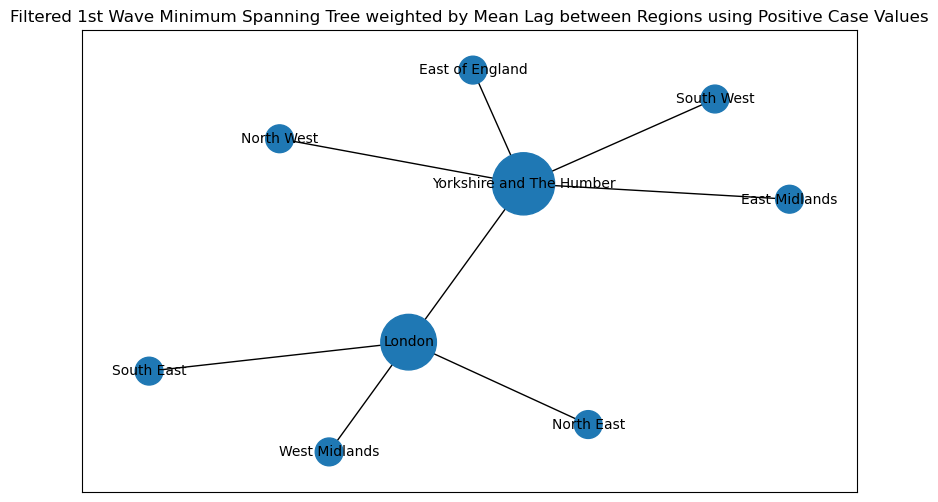

In [100]:
G = nx.from_pandas_edgelist(region_meanslag,'LTLA 1 Region','LTLA 2 Region', edge_attr='Lag in Days')
T = nx.minimum_spanning_tree(G, weight = 'Lag in Days')
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(T.nodes).keys()]
labels = {i:i for i in dict(T.nodes).keys()}


d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 400 for x in degree_values]

fig, ax = plt.subplots(figsize=(10,6))
pos = nx.spring_layout(T)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 10, ax=ax)

plt.title('Filtered 1st Wave Minimum Spanning Tree weighted by Mean Lag between Regions using Positive Case Values')
plt.show()

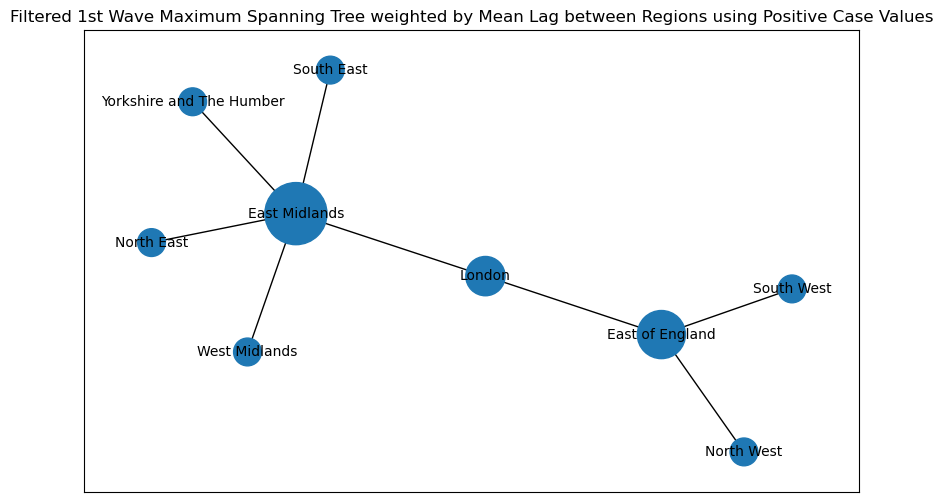

In [102]:
G = nx.from_pandas_edgelist(region_meanslag,'LTLA 1 Region','LTLA 2 Region', edge_attr='Lag in Days')
T = nx.maximum_spanning_tree(G, weight = 'Lag in Days'
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(T.nodes).keys()]
labels = {i:i for i in dict(T.nodes).keys()}



d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 400 for x in degree_values]

fig, ax = plt.subplots(figsize=(10,6))
pos = nx.spring_layout(T)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 10, ax=ax)

plt.title('Filtered 1st Wave Maximum Spanning Tree weighted by Mean Lag between Regions using Positive Case Values')
plt.show()

East Midlands consistently showing to have highest average lag with other regions and lowest correlation means. 

In [103]:
region_means2

,LTLA 1 Region,LTLA 2 Region,Maximum Correlation,Lag in Days,Distance > 150km?,Distance between centroids
0,East Midlands,East Midlands,0.434389,10.652564,0.001282,60.434507
1,East Midlands,East of England,0.499405,6.035156,0.501953,145.735584
2,East Midlands,London,0.528525,2.864407,0.813559,168.365156
3,East Midlands,North East,0.538516,4.116438,0.965753,210.381317
4,East Midlands,North West,0.472796,12.813913,0.401739,142.005793
...,...,...,...,...,...,...
76,Yorkshire and The Humber,North West,0.522305,16.221402,0.166052,99.867754
77,Yorkshire and The Humber,South East,0.550518,6.624625,1.000000,305.627420
78,Yorkshire and The Humber,South West,0.532503,7.301075,1.000000,327.330385
79,Yorkshire and The Humber,West Midlands,0.568405,6.294872,0.532051,153.127275


In [104]:
regions_chord = list(region_means2['LTLA 1 Region'].unique())


['East Midlands',
 'East of England',
 'London',
 'North East',
 'North West',
 'South East',
 'South West',
 'West Midlands',
 'Yorkshire and The Humber']

In [105]:
region_index = pd.Series(regions_chord).astype('category').cat.codes.values

In [108]:
regions_zip = list(zip(region_index, regions_chord))

regions = pd.DataFrame(regions_zip, columns = ['index','name'])
regions

,index,name
0,0,East Midlands
1,1,East of England
2,2,London
3,3,North East
4,4,North West
5,5,South East
6,6,South West
7,7,West Midlands
8,8,Yorkshire and The Humber


In [110]:
import holoviews as hv
from holoviews import opts, dim

In [118]:
hv.extension('matplotlib')
hv.output(fig='svg', size=500)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

In [111]:
nodes = hv.Dataset(regions, 'index')

In [112]:
chord_regions = region_means2.merge(regions, how='left', left_on = 'LTLA 1 Region', right_on = 'name')
chord_regions = chord_regions.merge(regions, how='left', left_on = 'LTLA 2 Region', right_on = 'name')
chord_regions

,LTLA 1 Region,LTLA 2 Region,Maximum Correlation,Lag in Days,Distance > 150km?,Distance between centroids,index_x,name_x,index_y,name_y
0,East Midlands,East Midlands,0.434389,10.652564,0.001282,60.434507,0,East Midlands,0,East Midlands
1,East Midlands,East of England,0.499405,6.035156,0.501953,145.735584,0,East Midlands,1,East of England
2,East Midlands,London,0.528525,2.864407,0.813559,168.365156,0,East Midlands,2,London
3,East Midlands,North East,0.538516,4.116438,0.965753,210.381317,0,East Midlands,3,North East
4,East Midlands,North West,0.472796,12.813913,0.401739,142.005793,0,East Midlands,4,North West
...,...,...,...,...,...,...,...,...,...,...
76,Yorkshire and The Humber,North West,0.522305,16.221402,0.166052,99.867754,8,Yorkshire and The Humber,4,North West
77,Yorkshire and The Humber,South East,0.550518,6.624625,1.000000,305.627420,8,Yorkshire and The Humber,5,South East
78,Yorkshire and The Humber,South West,0.532503,7.301075,1.000000,327.330385,8,Yorkshire and The Humber,6,South West
79,Yorkshire and The Humber,West Midlands,0.568405,6.294872,0.532051,153.127275,8,Yorkshire and The Humber,7,West Midlands


In [113]:
chord_regions = chord_regions.drop(columns = ['LTLA 1 Region', 'LTLA 2 Region', 'Distance > 150km?', 'Distance between centroids', 'name_x', 'name_y'])
chord_regions = chord_regions.rename(columns = {'index_x':'source', 'index_y':'target'})
chord_regions

,Maximum Correlation,Lag in Days,source,target
0,0.434389,10.652564,0,0
1,0.499405,6.035156,0,1
2,0.528525,2.864407,0,2
3,0.538516,4.116438,0,3
4,0.472796,12.813913,0,4
...,...,...,...,...
76,0.522305,16.221402,8,4
77,0.550518,6.624625,8,5
78,0.532503,7.301075,8,6
79,0.568405,6.294872,8,7


In [133]:
chord_regions_corr = chord_regions.rename(columns = {'Maximum Correlation':'value'})
chord_regions_corr = chord_regions_corr.drop(columns = ['Lag in Days'])


In [140]:
chord_regions_lag = chord_regions.rename(columns = {'Lag in Days':'value'})
chord_regions_lag = chord_regions_lag.drop(columns = ['Maximum Correlation'])

In [134]:
chord_regions_corr = chord_regions_corr.iloc[:, [1,2,0]]
chord_regions_corr

,source,target,value
0,0,0,0.434389
1,0,1,0.499405
2,0,2,0.528525
3,0,3,0.538516
4,0,4,0.472796
...,...,...,...
76,8,4,0.522305
77,8,5,0.550518
78,8,6,0.532503
79,8,7,0.568405


In [141]:
chord_regions_lag = chord_regions_lag.iloc[:, [1,2,0]]
chord_regions_lag

,source,target,value
0,0,0,10.652564
1,0,1,6.035156
2,0,2,2.864407
3,0,3,4.116438
4,0,4,12.813913
...,...,...,...
76,8,4,16.221402
77,8,5,6.624625
78,8,6,7.301075
79,8,7,6.294872


In [121]:
chord_regions_corr.nlargest(1,'value')

,source,target,value
20,2,2,0.815675


In [136]:
def normalize(values, bounds):
    return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
values_new = normalize(list(chord_regions_corr['value']),{'actual':{'lower':0.434,'upper':0.816},'desired':{'lower':1,'upper':500}})

In [137]:
chord_regions_corr['newvalue'] = values_new
chord_regions_corr = chord_regions_corr.drop(columns=['value'])
chord_regions_corr

,source,target,newvalue
0,0,0,1.508351
1,0,1,86.438020
2,0,2,124.476050
3,0,3,137.527233
4,0,4,51.678649
...,...,...,...
76,8,4,116.351139
77,8,5,153.204876
78,8,6,129.673082
79,8,7,176.570845


In [138]:
hv.Chord((chord_regions_corr,nodes)).opts(opts.Chord(cmap='Category20', edge_color=dim('source').astype(str), labels='name', node_color=dim('index').astype(str)))

:Chord   [source,target]   (newvalue)

In [142]:
hv.Chord((chord_regions_lag,nodes)).opts(opts.Chord(cmap='Category20', edge_color=dim('source').astype(str), labels='name', node_color=dim('index').astype(str)))

:Chord   [source,target]   (value)

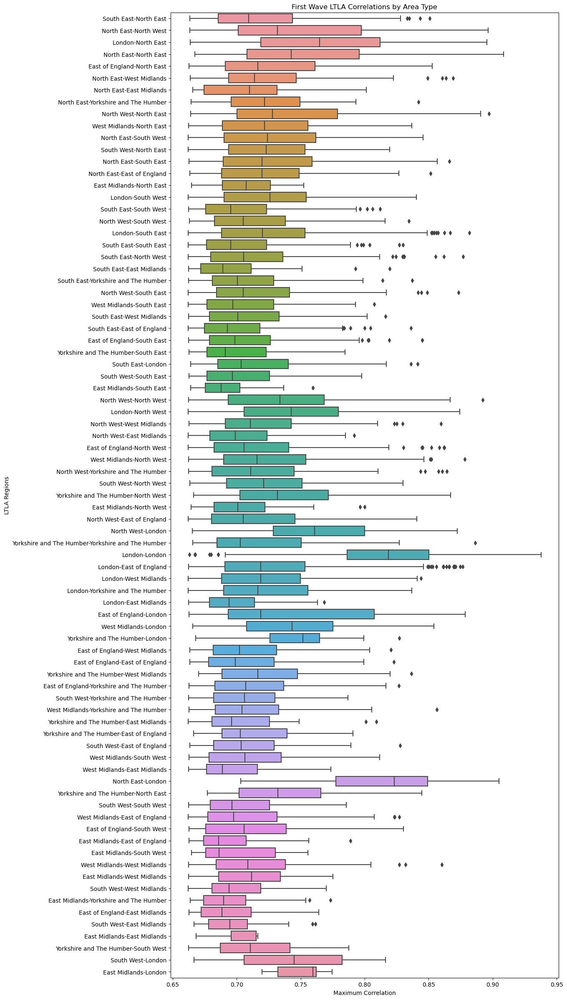

In [57]:
plt.figure(figsize=(12,30))
sns.boxplot(x=firstwave_lagnew["Maximum Correlation"], y= firstwave_lagnew['LTLA Regions'])
plt.title('First Wave LTLA Correlations by Area Type')
plt.show()

# 2nd Wave

In [50]:
secondwave = all_waves.loc[all_waves['Wave'] == '2nd']

In [51]:
secondwave_rep = secondwave.drop(columns=['Distance > 150km?'])

In [52]:
secondwave_new = lag_direction(secondwave, secondwave_rep)

/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/1245444803.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['LTLA 1'].iloc[i] = df2['LTLA 2'].iloc[i]
/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/1245444803.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['LTLA 2'].iloc[i] = df2['LTLA 1'].iloc[i]


In [54]:
secondwave_new['Lag in Days'] = abs(secondwave_new['Lag in Days'])

/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/2697976670.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  secondwave_new['Lag in Days'] = abs(secondwave_new['Lag in Days'])


In [56]:
secondwave_new = secondwave_new.merge(ltla2region, how='left', left_on='LTLA 1', right_on='LAD19NM')
secondwave_new = secondwave_new.merge(ltla2region, how='left', left_on='LTLA 2', right_on='LAD19NM')

In [57]:
secondwave_new = secondwave_new.drop(columns=['Unnamed: 0_x', 'LAD19NM_x', 'Colour_x', 'Unnamed: 0_y', 'LAD19NM_y', 'Colour_y'])
secondwave_new = secondwave_new.rename(columns={'RGN19NM_x':'LTLA 1 Region', 'RGN19NM_y':'LTLA 2 Region'})

In [58]:
secondwave_new["LTLA Regions"] = secondwave_new['LTLA 1 Region'].astype(str) +"-"+ secondwave_new["LTLA 2 Region"]

In [59]:
secondwave_new

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave,LTLA 1 Region,LTLA 2 Region,LTLA Regions
0,Redcar and Cleveland,East Devon,0.693965,0.0,Rural-Rural,True,446.686187,2nd,North East,South West,North East-South West
1,Redcar and Cleveland,Havant,0.611459,0.0,Rural-Rural,True,411.943769,2nd,North East,South East,North East-South East
2,Redcar and Cleveland,Surrey Heath,0.565359,0.0,Rural-Rural,True,357.783404,2nd,North East,South East,North East-South East
3,Redcar and Cleveland,Worthing,0.601492,0.0,Urban-Rural,True,416.062959,2nd,North East,South East,North East-South East
4,Redcar and Cleveland,Bolton,0.724827,0.0,Urban-Rural,False,143.901356,2nd,North East,North West,North East-North West
...,...,...,...,...,...,...,...,...,...,...,...
49136,Basingstoke and Deane,Rushcliffe,0.553512,0.0,Rural-Rural,True,181.384385,2nd,South East,East Midlands,South East-East Midlands
49137,Basingstoke and Deane,Hillingdon,0.913231,0.0,Urban-Rural,False,60.445984,2nd,South East,London,South East-London
49138,Tunbridge Wells,Rushcliffe,0.440782,0.0,Rural-Rural,True,222.863872,2nd,South East,East Midlands,South East-East Midlands
49139,Tunbridge Wells,Hillingdon,0.922426,0.0,Urban-Rural,False,77.442951,2nd,South East,London,South East-London


In [62]:
median_by_region2 = secondwave_new.groupby(['LTLA Regions'])['Maximum Correlation'].median().sort_values(ascending=False)

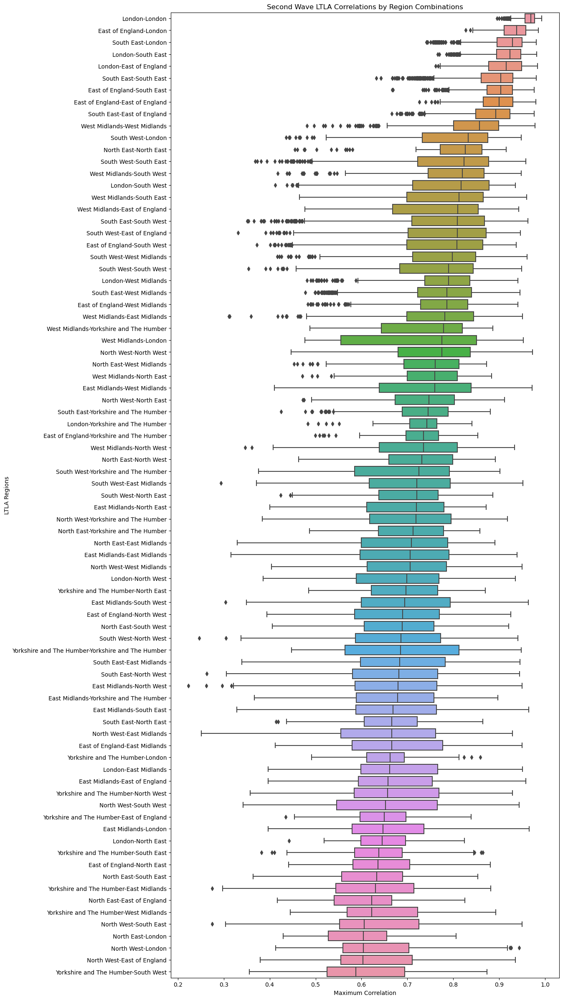

In [63]:
plt.figure(figsize=(12,30))
sns.boxplot(x=secondwave_new['Maximum Correlation'], y= secondwave_new['LTLA Regions'], order = median_by_region2.index)
plt.title('Second Wave LTLA Correlations by Region Combinations')
plt.show()

In [67]:
second_grouped = secondwave_new.groupby(['LTLA 1 Region', 'LTLA 2 Region'])
second_region_means = second_grouped.mean()
second_region_means = second_region_means.reset_index()

In [68]:
second_region_means

,LTLA 1 Region,LTLA 2 Region,Maximum Correlation,Lag in Days,Distance > 150km?,Distance between centroids
0,East Midlands,East Midlands,0.687522,6.146154,0.001282,60.434507
1,East Midlands,East of England,0.675042,16.957553,0.475655,141.302468
2,East Midlands,London,0.668376,19.267544,0.723684,168.303218
3,East Midlands,North East,0.694133,4.090909,0.954545,220.761737
4,East Midlands,North West,0.665582,7.385522,0.452862,147.111472
...,...,...,...,...,...,...
76,Yorkshire and The Humber,North West,0.671510,28.734783,0.234783,112.717958
77,Yorkshire and The Humber,South East,0.643206,48.980036,1.000000,290.754294
78,Yorkshire and The Humber,South West,0.609388,36.407674,1.000000,319.822550
79,Yorkshire and The Humber,West Midlands,0.648229,33.537778,0.546667,154.496413


In [119]:
second_region_means.nlargest(20,'Lag in Days')

,LTLA 1 Region,LTLA 2 Region,Maximum Correlation,Lag in Days,Distance > 150km?,Distance between centroids
73,Yorkshire and The Humber,East of England,0.649345,51.803030,0.947658,223.114054
74,Yorkshire and The Humber,London,0.659245,50.901031,1.000000,261.242700
77,Yorkshire and The Humber,South East,0.643206,48.980036,1.000000,290.754294
38,North West,London,0.634499,39.032520,1.000000,288.002054
78,Yorkshire and The Humber,South West,0.609388,36.407674,1.000000,319.822550
37,North West,East of England,0.634717,34.516802,1.000000,269.026402
79,Yorkshire and The Humber,West Midlands,0.648229,33.537778,0.546667,154.496413
41,North West,South East,0.639745,31.915923,1.000000,311.013272
76,Yorkshire and The Humber,North West,0.671510,28.734783,0.234783,112.717958
29,North East,London,0.598742,22.836842,1.000000,385.278595


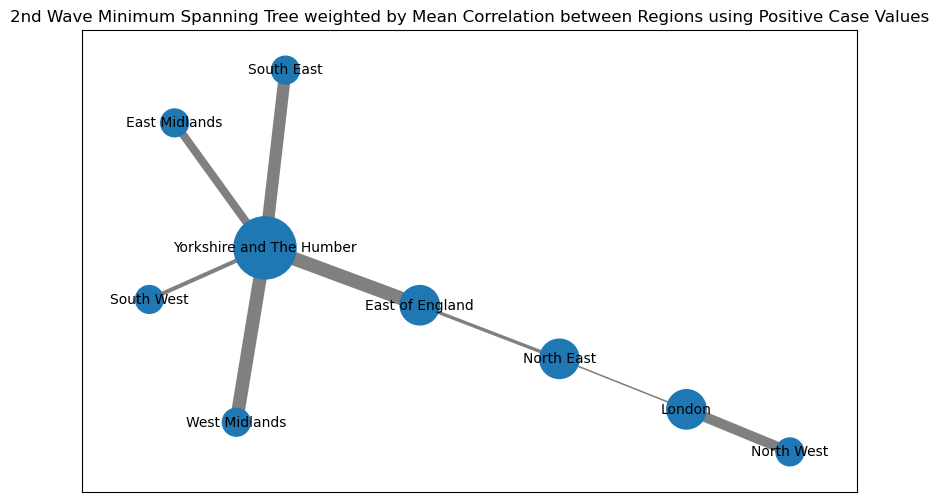

In [113]:
G = nx.from_pandas_edgelist(second_region_means,'LTLA 1 Region','LTLA 2 Region', edge_attr='Maximum Correlation')
T = nx.minimum_spanning_tree(G, weight = 'Maximum Correlation')
correlations = [i['Maximum Correlation'] for i in dict(T.edges).values()]
labels = [i for i in dict(T.nodes).keys()]
labels = {i:i for i in dict(T.nodes).keys()}

def normalize(values, bounds):
    return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
corrs_new = normalize(correlations,{'actual':{'lower':0.598,'upper':0.65},'desired':{'lower':1,'upper':10}})
corrs_rounded = [ round(elem, 0) for elem in corrs_new ]


d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 400 for x in degree_values]

fig, ax = plt.subplots(figsize=(10,6))
pos = nx.spring_layout(T)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, width = corrs_new, edge_color = 'grey', ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 10, ax=ax)

plt.title('2nd Wave Minimum Spanning Tree weighted by Mean Correlation between Regions using Positive Case Values')
plt.show()

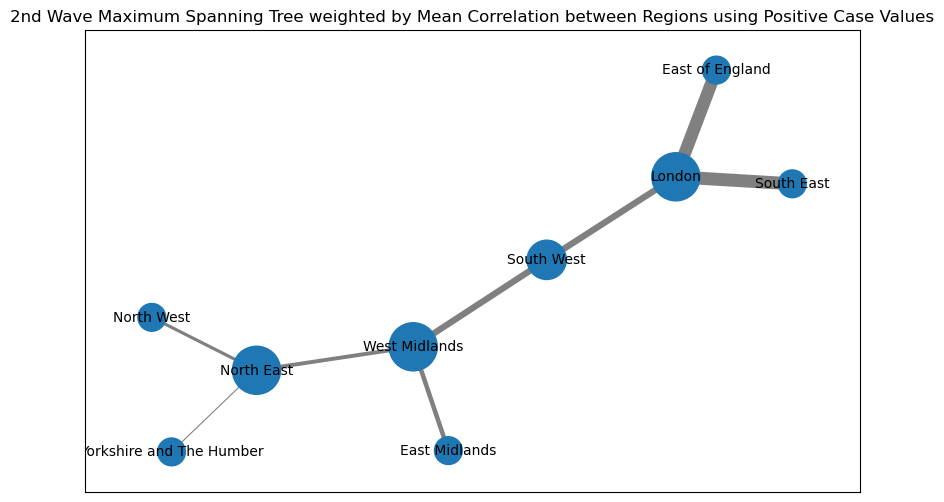

In [110]:
G = nx.from_pandas_edgelist(second_region_means,'LTLA 1 Region','LTLA 2 Region', edge_attr='Maximum Correlation')
T = nx.maximum_spanning_tree(G, weight = 'Maximum Correlation')
correlations = [i['Maximum Correlation'] for i in dict(T.edges).values()]
labels = [i for i in dict(T.nodes).keys()]
labels = {i:i for i in dict(T.nodes).keys()}

def normalize(values, bounds):
    return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
corrs_new = normalize(correlations,{'actual':{'lower':0.70,'upper':0.933},'desired':{'lower':1,'upper':10}})
corrs_rounded = [ round(elem, 0) for elem in corrs_new ]

#T = nx.maximum_spanning_tree(G, weight = 'Maximum Correlation')

d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 400 for x in degree_values]

fig, ax = plt.subplots(figsize=(10,6))
pos = nx.spring_layout(T)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, width = corrs_new, edge_color = 'grey', ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 10, ax=ax)

plt.title('2nd Wave Maximum Spanning Tree weighted by Mean Correlation between Regions using Positive Case Values')
plt.show()

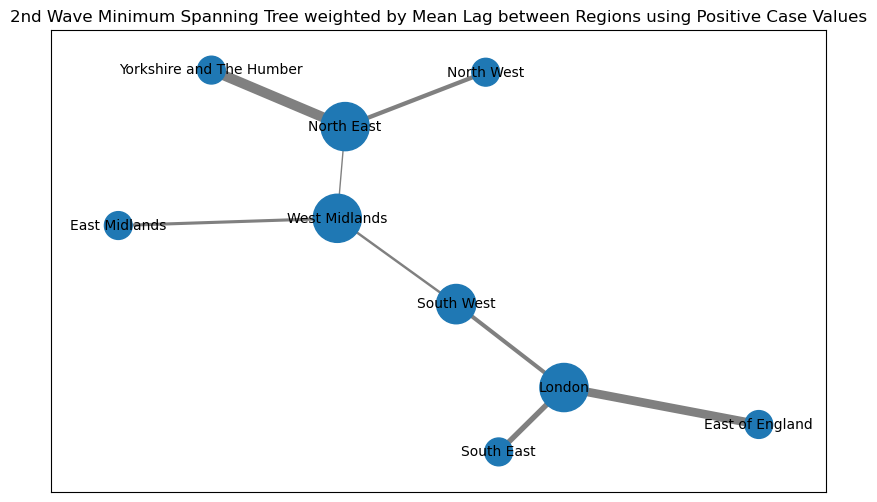

In [117]:
G = nx.from_pandas_edgelist(second_region_means,'LTLA 1 Region','LTLA 2 Region', edge_attr='Lag in Days')
T = nx.minimum_spanning_tree(G, weight = 'Lag in Days')
lag = [i['Lag in Days'] for i in dict(T.edges).values()]
labels = [i for i in dict(T.nodes).keys()]
labels = {i:i for i in dict(T.nodes).keys()}

def normalize(values, bounds):
    return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
lag_new = normalize(lag,{'actual':{'lower':0,'upper':3},'desired':{'lower':1,'upper':10}})


d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 400 for x in degree_values]

fig, ax = plt.subplots(figsize=(10,6))
pos = nx.spring_layout(T)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, width = lag_new, edge_color = 'grey',ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 10, ax=ax)

plt.title('2nd Wave Minimum Spanning Tree weighted by Mean Lag between Regions using Positive Case Values')
plt.show()

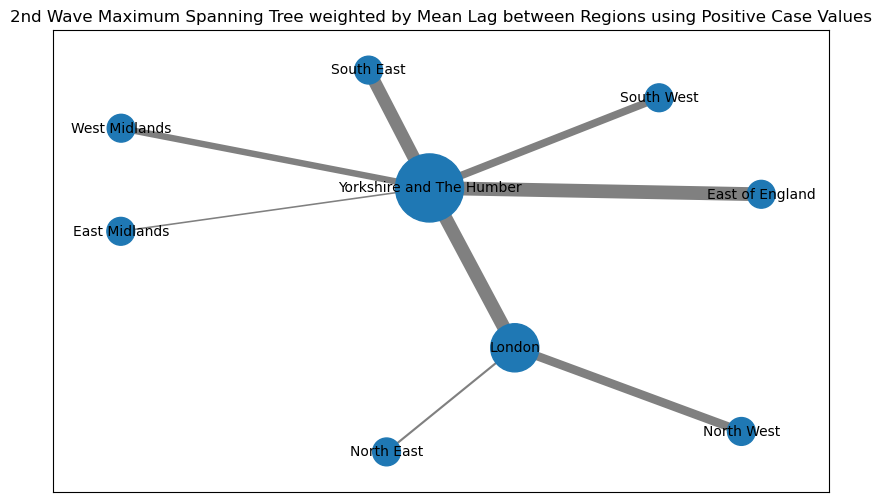

In [120]:
G = nx.from_pandas_edgelist(second_region_means,'LTLA 1 Region','LTLA 2 Region', edge_attr='Lag in Days')
T = nx.maximum_spanning_tree(G, weight = 'Lag in Days')
lag = [i['Lag in Days'] for i in dict(T.edges).values()]
labels = [i for i in dict(T.nodes).keys()]
labels = {i:i for i in dict(T.nodes).keys()}

def normalize(values, bounds):
    return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
lag_new = normalize(lag,{'actual':{'lower':21,'upper':52},'desired':{'lower':1,'upper':10}})


d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 400 for x in degree_values]

fig, ax = plt.subplots(figsize=(10,6))
pos = nx.spring_layout(T)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, width = lag_new, edge_color = 'grey',ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 10, ax=ax)

plt.title('2nd Wave Maximum Spanning Tree weighted by Mean Lag between Regions using Positive Case Values')
plt.show()

# 3rd Wave

In [121]:
thirdwave = all_waves.loc[all_waves['Wave'] == '3rd']

In [122]:
thirdwave_rep = thirdwave.drop(columns=['Distance > 150km?'])

In [123]:
thirdwave_new = lag_direction(thirdwave, thirdwave_rep)

/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/1245444803.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['LTLA 1'].iloc[i] = df2['LTLA 2'].iloc[i]
/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/1245444803.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['LTLA 2'].iloc[i] = df2['LTLA 1'].iloc[i]


In [124]:
thirdwave_new['Lag in Days'] = abs(thirdwave_new['Lag in Days'])

/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/1506444159.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  thirdwave_new['Lag in Days'] = abs(thirdwave_new['Lag in Days'])


In [125]:
thirdwave_new = thirdwave_new.merge(ltla2region, how='left', left_on='LTLA 1', right_on='LAD19NM')
thirdwave_new = thirdwave_new.merge(ltla2region, how='left', left_on='LTLA 2', right_on='LAD19NM')

In [126]:
thirdwave_new = thirdwave_new.drop(columns=['Unnamed: 0_x', 'LAD19NM_x', 'Colour_x', 'Unnamed: 0_y', 'LAD19NM_y', 'Colour_y'])
thirdwave_new = thirdwave_new.rename(columns={'RGN19NM_x':'LTLA 1 Region', 'RGN19NM_y':'LTLA 2 Region'})

In [127]:
thirdwave_new["LTLA Regions"] = thirdwave_new['LTLA 1 Region'].astype(str) +"-"+ thirdwave_new["LTLA 2 Region"]

In [129]:
thirdwave_new

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave,LTLA 1 Region,LTLA 2 Region,LTLA Regions
0,Redcar and Cleveland,East Devon,0.534703,0.0,Rural-Rural,True,446.686187,3rd,North East,South West,North East-South West
1,Redcar and Cleveland,Havant,0.718688,0.0,Rural-Rural,True,411.943769,3rd,North East,South East,North East-South East
2,Redcar and Cleveland,Surrey Heath,0.709259,0.0,Rural-Rural,True,357.783404,3rd,North East,South East,North East-South East
3,Redcar and Cleveland,Worthing,0.615529,0.0,Urban-Rural,True,416.062959,3rd,North East,South East,North East-South East
4,Redcar and Cleveland,Bolton,0.907420,0.0,Urban-Rural,False,143.901356,3rd,North East,North West,North East-North West
...,...,...,...,...,...,...,...,...,...,...,...
49136,Basingstoke and Deane,Rushcliffe,0.917484,0.0,Rural-Rural,True,181.384385,3rd,South East,East Midlands,South East-East Midlands
49137,Basingstoke and Deane,Hillingdon,0.906936,0.0,Urban-Rural,False,60.445984,3rd,South East,London,South East-London
49138,Tunbridge Wells,Rushcliffe,0.903993,0.0,Rural-Rural,True,222.863872,3rd,South East,East Midlands,South East-East Midlands
49139,Tunbridge Wells,Hillingdon,0.868682,0.0,Urban-Rural,False,77.442951,3rd,South East,London,South East-London


In [130]:
median_by_region3 = thirdwave_new.groupby(['LTLA Regions'])['Maximum Correlation'].median().sort_values(ascending=False)

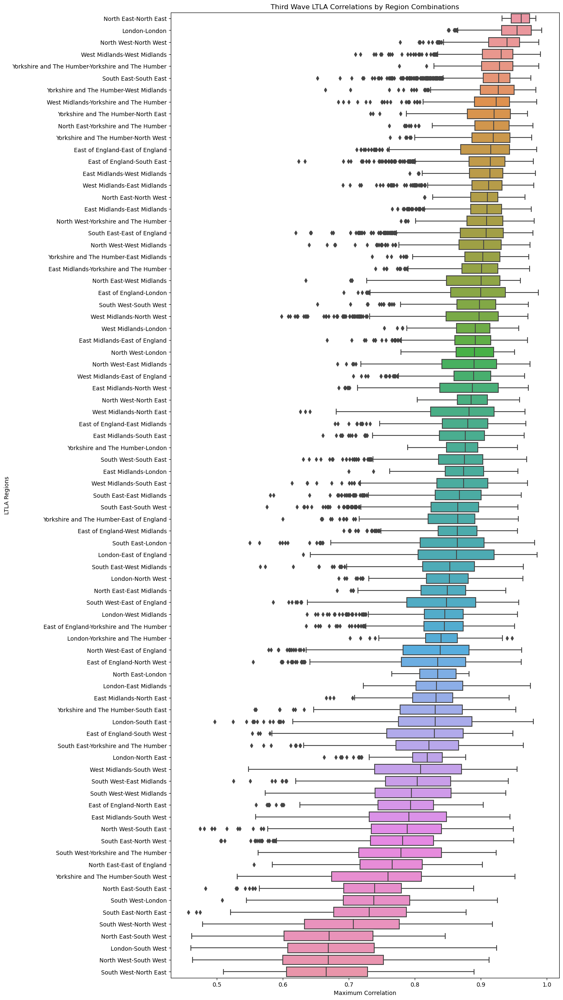

In [131]:
plt.figure(figsize=(12,30))
sns.boxplot(x=thirdwave_new['Maximum Correlation'], y= thirdwave_new['LTLA Regions'], order = median_by_region3.index)
plt.title('Third Wave LTLA Correlations by Region Combinations')
plt.show()

In [132]:
third_grouped = thirdwave_new.groupby(['LTLA 1 Region', 'LTLA 2 Region'])
third_region_means = third_grouped.mean()
third_region_means = third_region_means.reset_index()

In [148]:
third_region_means.nlargest(20,'Lag in Days')

,LTLA 1 Region,LTLA 2 Region,Maximum Correlation,Lag in Days,Distance > 150km?,Distance between centroids
21,London,North East,0.815469,10.439306,1.000000,379.800314
26,London,Yorkshire and The Humber,0.839204,8.827526,1.000000,273.867758
25,London,West Midlands,0.839627,8.202719,0.812114,176.878491
22,London,North West,0.848587,6.966303,1.000000,304.019148
24,London,South West,0.676788,6.447563,0.821270,214.432352
18,London,East Midlands,0.839624,6.244734,0.673019,167.145956
12,East of England,North East,0.780920,5.197802,1.000000,347.132294
19,London,East of England,0.858250,3.527192,0.127636,84.801818
48,South East,North East,0.728923,3.109137,1.000000,407.950565
17,East of England,Yorkshire and The Humber,0.841059,2.822222,0.969231,243.214586


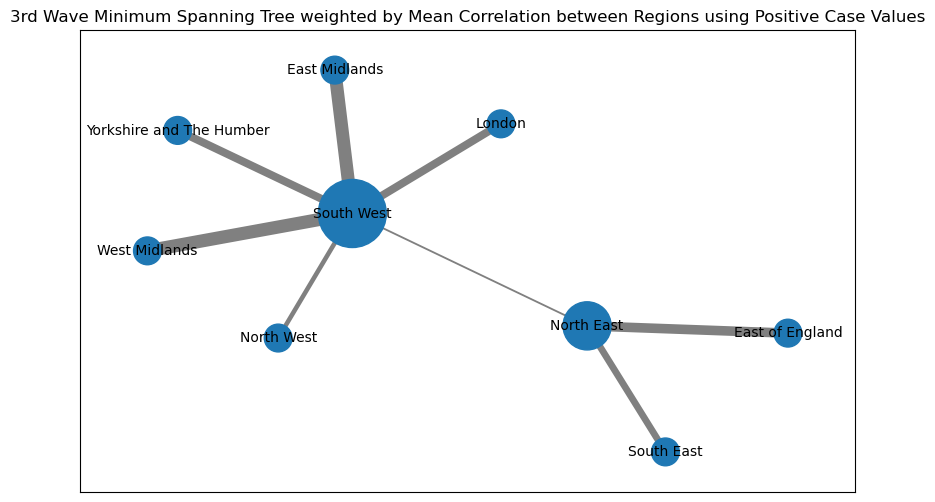

In [149]:
G = nx.from_pandas_edgelist(third_region_means,'LTLA 1 Region','LTLA 2 Region', edge_attr='Maximum Correlation')
T = nx.minimum_spanning_tree(G, weight = 'Maximum Correlation')
correlations = [i['Maximum Correlation'] for i in dict(T.edges).values()]
labels = [i for i in dict(T.nodes).keys()]
labels = {i:i for i in dict(T.nodes).keys()}

def normalize(values, bounds):
    return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
corrs_new = normalize(correlations,{'actual':{'lower':0.668,'upper':0.81},'desired':{'lower':1,'upper':10}})
corrs_rounded = [ round(elem, 0) for elem in corrs_new ]


d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 400 for x in degree_values]

fig, ax = plt.subplots(figsize=(10,6))
pos = nx.spring_layout(T)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, width = corrs_new, edge_color = 'grey', ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 10, ax=ax)

plt.title('3rd Wave Minimum Spanning Tree weighted by Mean Correlation between Regions using Positive Case Values')
plt.show()

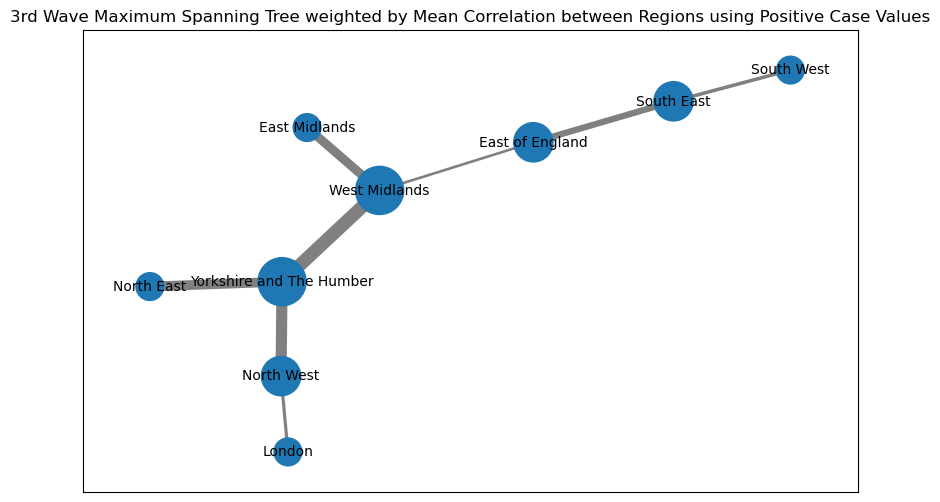

In [139]:
G = nx.from_pandas_edgelist(third_region_means,'LTLA 1 Region','LTLA 2 Region', edge_attr='Maximum Correlation')
T = nx.maximum_spanning_tree(G, weight = 'Maximum Correlation')
correlations = [i['Maximum Correlation'] for i in dict(T.edges).values()]
labels = [i for i in dict(T.nodes).keys()]
labels = {i:i for i in dict(T.nodes).keys()}

def normalize(values, bounds):
    return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
corrs_new = normalize(correlations,{'actual':{'lower':0.88,'upper':0.92},'desired':{'lower':1,'upper':10}})
corrs_rounded = [ round(elem, 0) for elem in corrs_new ]


d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 400 for x in degree_values]

fig, ax = plt.subplots(figsize=(10,6))
pos = nx.spring_layout(T)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, width = corrs_new, edge_color = 'grey', ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 10, ax=ax)

plt.title('3rd Wave Maximum Spanning Tree weighted by Mean Correlation between Regions using Positive Case Values')
plt.show()

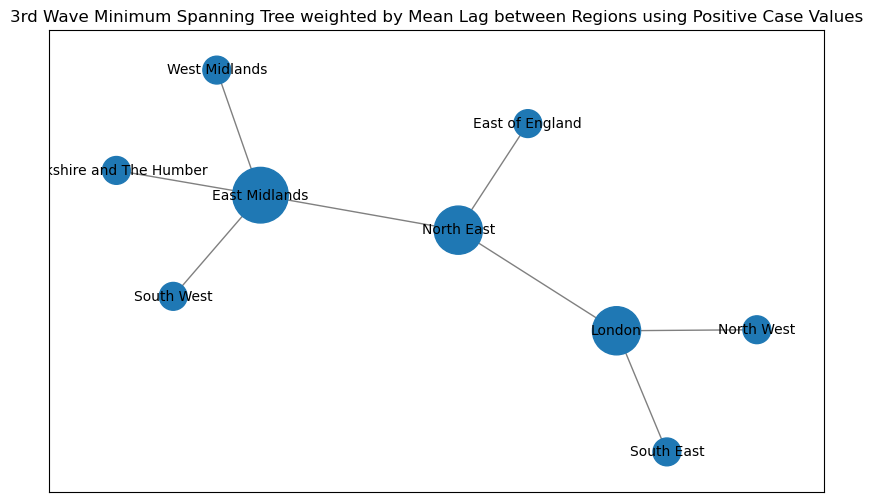

In [142]:
G = nx.from_pandas_edgelist(third_region_means,'LTLA 1 Region','LTLA 2 Region', edge_attr='Lag in Days')
T = nx.minimum_spanning_tree(G, weight = 'Lag in Days')
lag = [i['Lag in Days'] for i in dict(T.edges).values()]
labels = [i for i in dict(T.nodes).keys()]
labels = {i:i for i in dict(T.nodes).keys()}

def normalize(values, bounds):
    return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
lag_new = normalize(lag,{'actual':{'lower':0,'upper':1},'desired':{'lower':1,'upper':10}})


d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 400 for x in degree_values]

fig, ax = plt.subplots(figsize=(10,6))
pos = nx.spring_layout(T)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, width = lag_new, edge_color = 'grey',ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 10, ax=ax)

plt.title('3rd Wave Minimum Spanning Tree weighted by Mean Lag between Regions using Positive Case Values')
plt.show()

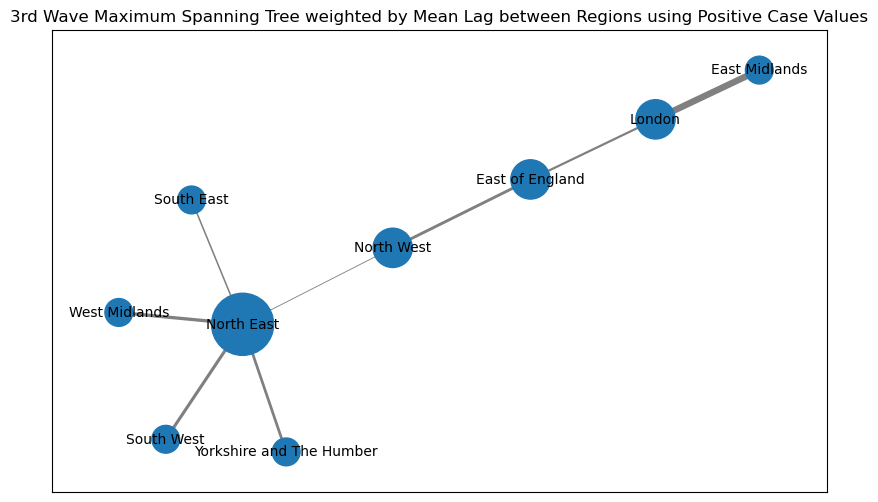

In [144]:
G = nx.from_pandas_edgelist(third_region_means,'LTLA 1 Region','LTLA 2 Region', edge_attr='Lag in Days')
T = nx.maximum_spanning_tree(G, weight = 'Lag in Days')
lag = [i['Lag in Days'] for i in dict(T.edges).values()]
labels = [i for i in dict(T.nodes).keys()]
labels = {i:i for i in dict(T.nodes).keys()}

def normalize(values, bounds):
    return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]
lag_new = normalize(lag,{'actual':{'lower':3,'upper':11},'desired':{'lower':1,'upper':10}})


d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 400 for x in degree_values]

fig, ax = plt.subplots(figsize=(10,6))
pos = nx.spring_layout(T)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, width = lag_new, edge_color = 'grey',ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 10, ax=ax)

plt.title('3rd Wave Maximum Spanning Tree weighted by Mean Lag between Regions using Positive Case Values')
plt.show()

# Lag not equal 0

Now want to investigate when the lag is not zero. When lag is zero we cannot say the two LTLAs are well connected as there is no lead-lag relationship that suggests connectivity.

In [154]:
lag_notzero = all_waves.loc[all_waves['Lag in Days'] != 0]

In [155]:
lag_notzero

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave
0,Redcar and Cleveland,East Devon,0.597890,6.0,Rural-Rural,True,446.686187,1st
1,Redcar and Cleveland,Havant,0.705012,-6.0,Rural-Rural,True,411.943769,1st
2,Redcar and Cleveland,Surrey Heath,0.610272,-6.0,Rural-Rural,True,357.783404,1st
3,Redcar and Cleveland,Worthing,0.618926,-6.0,Urban-Rural,True,416.062959,1st
4,Redcar and Cleveland,Bolton,0.696269,9.0,Urban-Rural,False,143.901356,1st
...,...,...,...,...,...,...,...,...
147361,Tandridge,County Durham,0.749916,7.0,Rural-Rural,True,404.284577,3rd
147380,Stevenage,County Durham,0.830321,7.0,Urban-Rural,True,329.421408,3rd
147388,St. Helens,County Durham,0.875165,7.0,Urban-Rural,False,149.145117,3rd
147403,County Durham,Colchester,0.767533,-7.0,Urban-Rural,True,361.568810,3rd


In [156]:
lag_notzero['Wave'].value_counts()

1st    46653
2nd    16319
3rd     6379
Name: Wave, dtype: int64

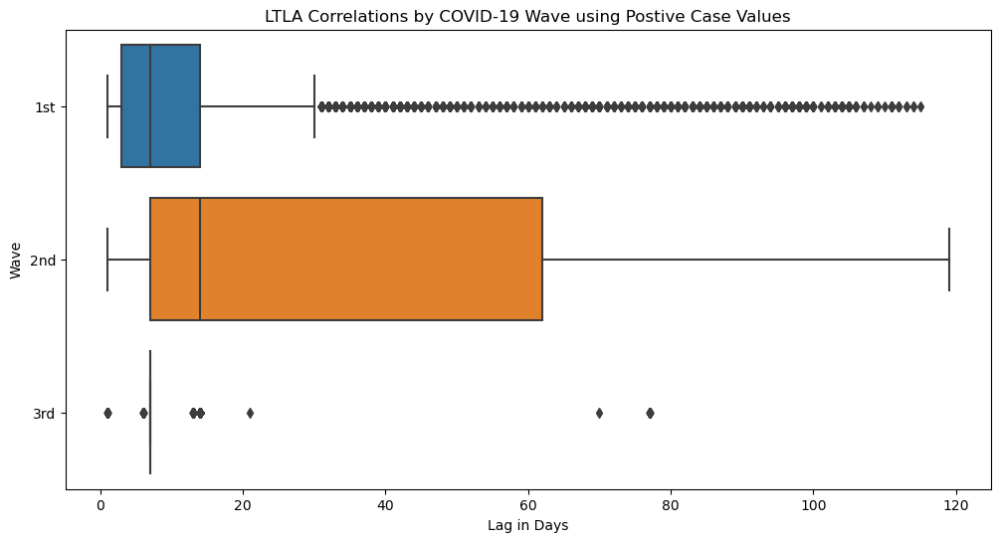

In [158]:
plt.figure(figsize=(12,6))
sns.boxplot(x=abs(lag_notzero["Lag in Days"]), y= lag_notzero['Wave'])
plt.title('LTLA Correlations by COVID-19 Wave using Postive Case Values')
plt.show()

Median and 75% values higher in 2nd wave due to a number of LTLA correlations having a high lag caused by seperate peaks seen in November and then January.

## 1st Wave

In [211]:
lag_notzero1 = lag_notzero.loc[lag_notzero['Wave'] == '1st']
lag_notzero1

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave
0,Redcar and Cleveland,East Devon,0.597890,6.0,Rural-Rural,True,446.686187,1st
1,Redcar and Cleveland,Havant,0.705012,-6.0,Rural-Rural,True,411.943769,1st
2,Redcar and Cleveland,Surrey Heath,0.610272,-6.0,Rural-Rural,True,357.783404,1st
3,Redcar and Cleveland,Worthing,0.618926,-6.0,Urban-Rural,True,416.062959,1st
4,Redcar and Cleveland,Bolton,0.696269,9.0,Urban-Rural,False,143.901356,1st
...,...,...,...,...,...,...,...,...
49136,Basingstoke and Deane,Rushcliffe,0.476345,6.0,Rural-Rural,True,181.384385,1st
49137,Basingstoke and Deane,Hillingdon,0.750190,-3.0,Urban-Rural,False,60.445984,1st
49138,Tunbridge Wells,Rushcliffe,0.382597,-7.0,Rural-Rural,True,222.863872,1st
49139,Tunbridge Wells,Hillingdon,0.413961,-47.0,Urban-Rural,False,77.442951,1st


Remove any rows where lag greater than 21 days.

In [212]:
lag_notzero1 = lag_notzero1.loc[abs(lag_notzero1['Lag in Days']) <= 21]

In [163]:
lag_notzero1

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave
0,Redcar and Cleveland,East Devon,0.597890,6.0,Rural-Rural,True,446.686187,1st
1,Redcar and Cleveland,Havant,0.705012,-6.0,Rural-Rural,True,411.943769,1st
2,Redcar and Cleveland,Surrey Heath,0.610272,-6.0,Rural-Rural,True,357.783404,1st
3,Redcar and Cleveland,Worthing,0.618926,-6.0,Urban-Rural,True,416.062959,1st
4,Redcar and Cleveland,Bolton,0.696269,9.0,Urban-Rural,False,143.901356,1st
...,...,...,...,...,...,...,...,...
49134,Colchester,Hillingdon,0.743909,-18.0,Urban-Urban,False,97.470539,1st
49136,Basingstoke and Deane,Rushcliffe,0.476345,6.0,Rural-Rural,True,181.384385,1st
49137,Basingstoke and Deane,Hillingdon,0.750190,-3.0,Urban-Rural,False,60.445984,1st
49138,Tunbridge Wells,Rushcliffe,0.382597,-7.0,Rural-Rural,True,222.863872,1st


In [164]:
lag_notzero1.describe()

,Maximum Correlation,Lag in Days,Distance between centroids
count,41031.000000,41031.000000,41031.000000
mean,0.581458,0.089347,184.920438
std,0.119381,9.404598,105.814004
min,0.170068,-21.000000,2.246661
25%,0.504950,-7.000000,99.808110
50%,0.590959,-1.000000,171.767579
75%,0.666157,6.000000,259.678620
max,0.937753,21.000000,568.808378


In [168]:
print(list(T.edges(data = True)))

[('Redcar and Cleveland', 'County Durham', {'Maximum Correlation': 0.7943963200530307}), ('East Devon', 'Carlisle', {'Maximum Correlation': 0.6866750799285831}), ('Havant', 'East Hampshire', {'Maximum Correlation': 0.7721027561056296}), ('Surrey Heath', 'Barnet', {'Maximum Correlation': 0.8164161754626703}), ('Worthing', 'Wigan', {'Maximum Correlation': 0.7811317311842652}), ('Bolton', 'Liverpool', {'Maximum Correlation': 0.8166604537393667}), ('Trafford', 'Liverpool', {'Maximum Correlation': 0.7792723415207276}), ('Barnsley', 'Rotherham', {'Maximum Correlation': 0.6959867111558337}), ('Hounslow', 'Bromley', {'Maximum Correlation': 0.8858999587250908}), ('Wandsworth', 'Camden', {'Maximum Correlation': 0.9074896162364728}), ('Wandsworth', 'Lambeth', {'Maximum Correlation': 0.9070921620227644}), ('Wandsworth', 'Westminster', {'Maximum Correlation': 0.87708569404846}), ('Wandsworth', 'Sutton', {'Maximum Correlation': 0.8577242965224294}), ('Wandsworth', 'Redbridge', {'Maximum Correlation'

In [170]:
lag_notzero1.loc[lag_notzero1['LTLA 1'] == 'Bradford']

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave
2483,Bradford,Rossendale,0.342446,-20.0,Rural-Rural,False,32.011613,1st
2485,Bradford,Selby,0.333727,-6.0,Rural-Rural,False,47.745106,1st
2486,Bradford,Mendip,0.342256,-7.0,Rural-Rural,True,297.555112,1st
2487,Bradford,Mid Suffolk,0.347247,-5.0,Rural-Rural,True,265.729753,1st
2489,Bradford,Gateshead,0.360437,-21.0,Rural-Rural,False,121.878327,1st
...,...,...,...,...,...,...,...,...
2768,Bradford,Wyre,0.389878,-21.0,Rural-Rural,False,64.719296,1st
2770,Bradford,North Warwickshire,0.363266,-13.0,Rural-Rural,False,145.040320,1st
2774,Bradford,County Durham,0.399023,-14.0,Rural-Rural,False,94.671313,1st
2776,Bradford,Colchester,0.332192,-16.0,Urban-Rural,True,285.124843,1st


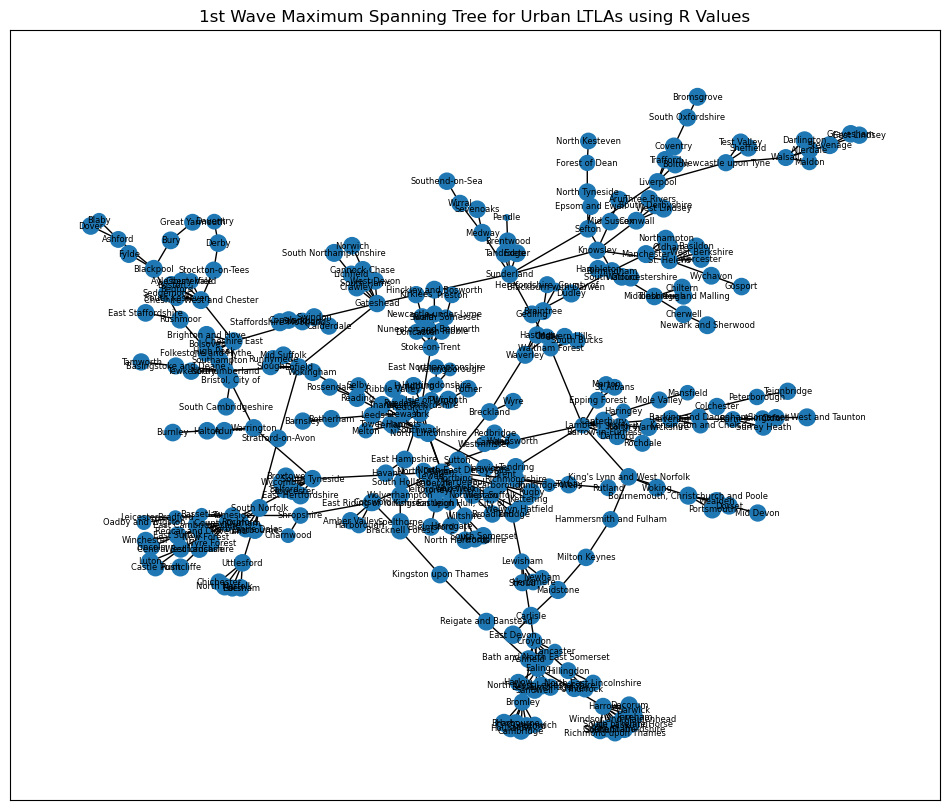

In [312]:

G = nx.from_pandas_edgelist(lag_notzero1,source = 'LTLA 1',target = 'LTLA 2', edge_attr='Maximum Correlation',)

T = nx.maximum_spanning_tree(G, weight = 'Maximum Correlation', )
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(T.nodes).keys()]
labels = {i:i for i in dict(T.nodes).keys()}


d = G.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 0.5 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(T, seed=1)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, arrowstyle="->", ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 6, ax=ax)

plt.title('1st Wave Maximum Spanning Tree for Urban LTLAs using R Values')
plt.show()

In [360]:
lag_notzero1test = lag_notzero1new.loc[lag_notzero1new['Maximum Correlation'] > 0.87]

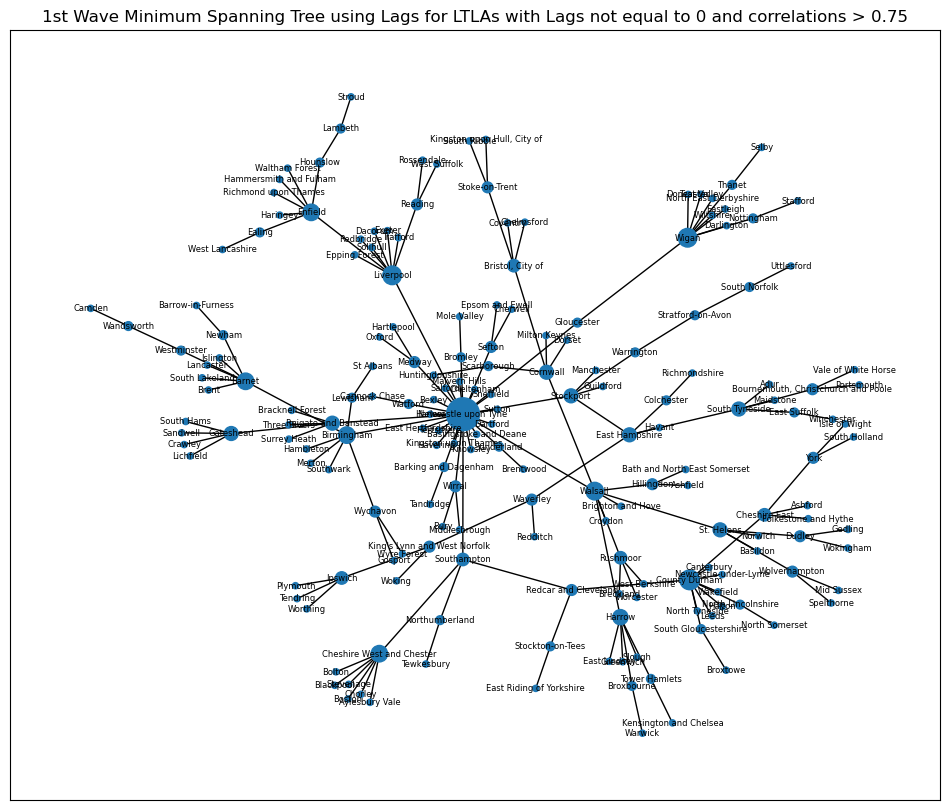

In [343]:

G = nx.from_pandas_edgelist(lag_notzero1test,'LTLA 1','LTLA 2', edge_attr='Lag in Days',)

T = nx.minimum_spanning_tree(G, weight = 'Lag in Days', )
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(T.nodes).keys()]
labels = {i:i for i in dict(T.nodes).keys()}


d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 20 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(T, seed=1)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 6, ax=ax)

plt.title('1st Wave Minimum Spanning Tree using Lags for LTLAs with Lags not equal to 0 and correlations > 0.75')
plt.show()

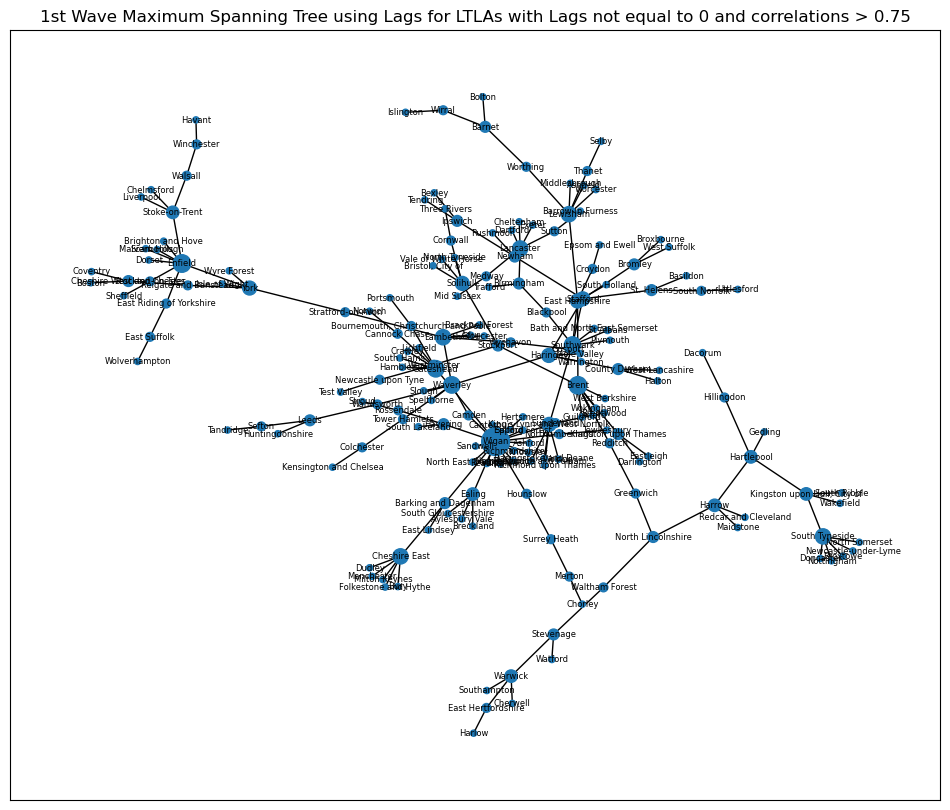

In [344]:

G = nx.from_pandas_edgelist(lag_notzero1test,'LTLA 1','LTLA 2', edge_attr='Lag in Days',)

T = nx.maximum_spanning_tree(G, weight = 'Lag in Days', )
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(T.nodes).keys()]
labels = {i:i for i in dict(T.nodes).keys()}


d = T.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 20 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(T, seed=1)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 6, ax=ax)

plt.title('1st Wave Maximum Spanning Tree using Lags for LTLAs with Lags not equal to 0 and correlations > 0.75')
plt.show()

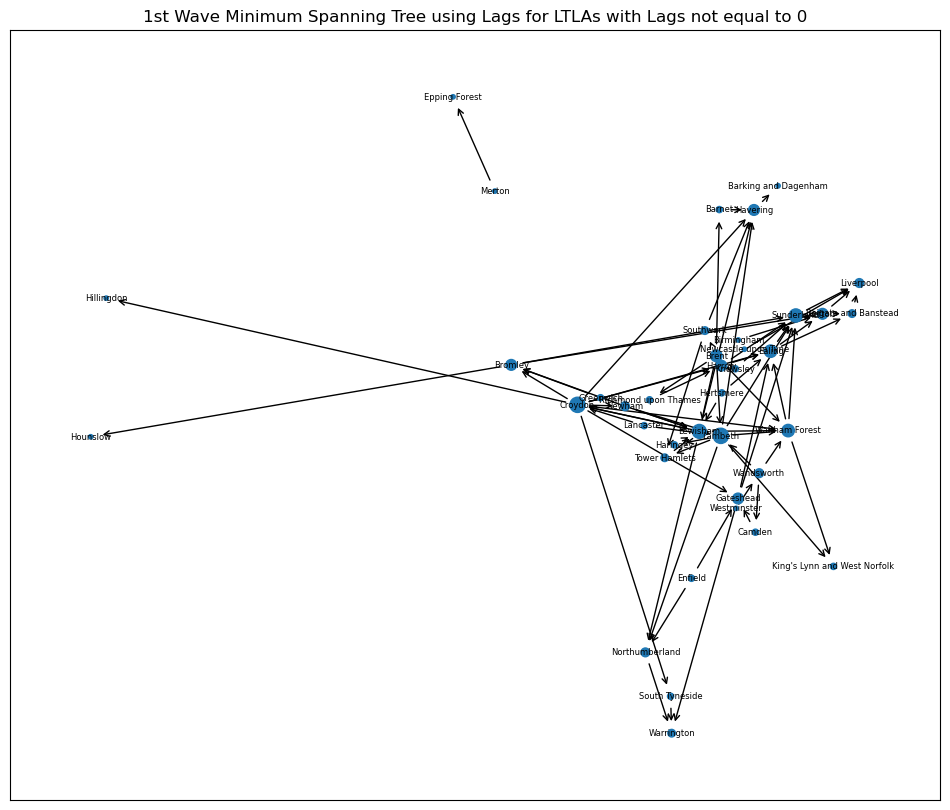

In [361]:
G = nx.from_pandas_edgelist(lag_notzero1test,source = 'LTLA 1',target = 'LTLA 2', edge_attr='Lag in Days', create_using=nx.DiGraph())

#T = nx.minimum_spanning_tree(G, weight = 'Lag in Days', )
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}


d = G.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 10 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(G, pos, arrowstyle = "->",ax=ax)
nx.draw_networkx_labels(G, pos, labels, font_size = 6, ax=ax)

plt.title('1st Wave Directional Spanning Tree using Lags for LTLAs with Lags not equal to 0 and correlations > 0.87')
plt.show()

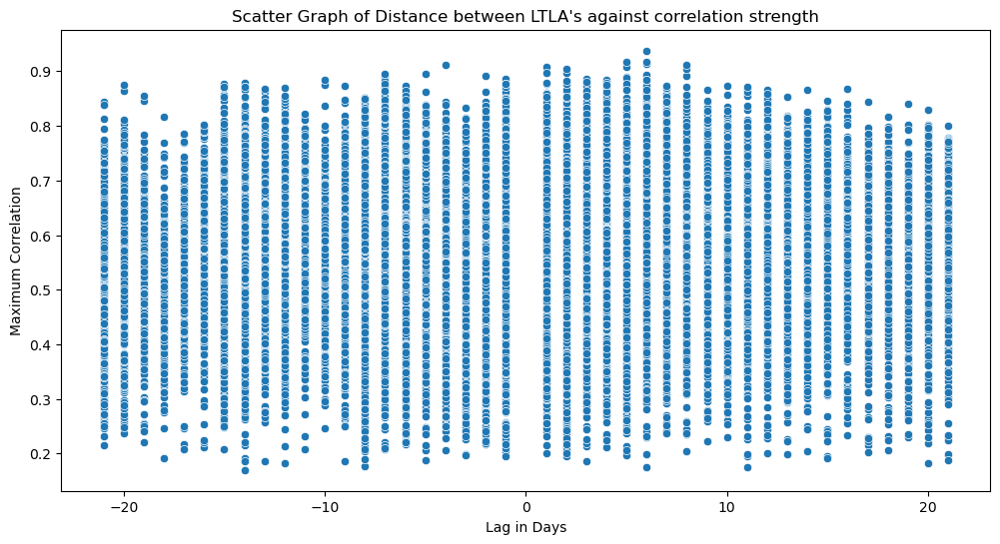

In [194]:
plt.figure(figsize=(12,6))

sns.scatterplot(data = lag_notzero1, x = "Lag in Days", y = "Maximum Correlation")
plt.title("Scatter Graph of Distance between LTLA's against correlation strength")

plt.show()

In [213]:
lag_notzero1rep = lag_notzero1.drop(columns=['Distance > 150km?'])

In [214]:
lag_notzero1

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave
0,Redcar and Cleveland,East Devon,0.597890,6.0,Rural-Rural,True,446.686187,1st
1,Redcar and Cleveland,Havant,0.705012,-6.0,Rural-Rural,True,411.943769,1st
2,Redcar and Cleveland,Surrey Heath,0.610272,-6.0,Rural-Rural,True,357.783404,1st
3,Redcar and Cleveland,Worthing,0.618926,-6.0,Urban-Rural,True,416.062959,1st
4,Redcar and Cleveland,Bolton,0.696269,9.0,Urban-Rural,False,143.901356,1st
...,...,...,...,...,...,...,...,...
49134,Colchester,Hillingdon,0.743909,-18.0,Urban-Urban,False,97.470539,1st
49136,Basingstoke and Deane,Rushcliffe,0.476345,6.0,Rural-Rural,True,181.384385,1st
49137,Basingstoke and Deane,Hillingdon,0.750190,-3.0,Urban-Rural,False,60.445984,1st
49138,Tunbridge Wells,Rushcliffe,0.382597,-7.0,Rural-Rural,True,222.863872,1st


In [207]:
lag_notzero1rep

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave
0,Redcar and Cleveland,East Devon,0.597890,6.0,Rural-Rural,True,446.686187,1st
1,Redcar and Cleveland,Havant,0.705012,-6.0,Rural-Rural,True,411.943769,1st
2,Redcar and Cleveland,Surrey Heath,0.610272,-6.0,Rural-Rural,True,357.783404,1st
3,Redcar and Cleveland,Worthing,0.618926,-6.0,Urban-Rural,True,416.062959,1st
4,Redcar and Cleveland,Bolton,0.696269,9.0,Urban-Rural,False,143.901356,1st
...,...,...,...,...,...,...,...,...
49134,Colchester,Hillingdon,0.743909,-18.0,Urban-Urban,False,97.470539,1st
49136,Basingstoke and Deane,Rushcliffe,0.476345,6.0,Rural-Rural,True,181.384385,1st
49137,Basingstoke and Deane,Hillingdon,0.750190,-3.0,Urban-Rural,False,60.445984,1st
49138,Tunbridge Wells,Rushcliffe,0.382597,-7.0,Rural-Rural,True,222.863872,1st


In [215]:
lag_notzero1new = lag_direction(lag_notzero1, lag_notzero1rep)

/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/1245444803.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['LTLA 1'].iloc[i] = df2['LTLA 2'].iloc[i]
/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/1245444803.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['LTLA 2'].iloc[i] = df2['LTLA 1'].iloc[i]


In [216]:
lag_notzero1new['Lag in Days'] = abs(lag_notzero1new['Lag in Days'])

/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/2662976422.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lag_notzero1new['Lag in Days'] = abs(lag_notzero1new['Lag in Days'])


In [217]:
lag_notzero1new

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave
0,Redcar and Cleveland,East Devon,0.597890,6.0,Rural-Rural,True,446.686187,1st
1,Havant,Redcar and Cleveland,0.705012,6.0,Rural-Rural,True,411.943769,1st
2,Surrey Heath,Redcar and Cleveland,0.610272,6.0,Rural-Rural,True,357.783404,1st
3,Worthing,Redcar and Cleveland,0.618926,6.0,Urban-Rural,True,416.062959,1st
4,Redcar and Cleveland,Bolton,0.696269,9.0,Urban-Rural,False,143.901356,1st
...,...,...,...,...,...,...,...,...
49134,Hillingdon,Colchester,0.743909,18.0,Urban-Urban,False,97.470539,1st
49136,Basingstoke and Deane,Rushcliffe,0.476345,6.0,Rural-Rural,True,181.384385,1st
49137,Hillingdon,Basingstoke and Deane,0.750190,3.0,Urban-Rural,False,60.445984,1st
49138,Rushcliffe,Tunbridge Wells,0.382597,7.0,Rural-Rural,True,222.863872,1st


In [221]:
lead_counts = lag_notzero1new['LTLA 1'].value_counts()

In [236]:
lead_counts_df = pd.DataFrame(lead_counts)

In [237]:
lead_counts_df = lead_counts_df.reset_index()
lead_counts_df = lead_counts_df.rename(columns = {'index': 'LTLA 1', 'LTLA 1':'Lead count'})

In [248]:
lag_counts = lag_notzero1new['LTLA 2'].value_counts()

In [249]:
lag_counts_df = pd.DataFrame(lag_counts)
lag_counts_df = lag_counts_df.reset_index()
lag_counts_df = lag_counts_df.rename(columns = {'index': 'LTLA 2', 'LTLA 2':'Lag count'})

In [243]:
lead_counts_df

,LTLA 1,Lead count
0,Elmbridge,239
1,South Bucks,237
2,Spelthorne,234
3,Copeland,234
4,Rochford,233
...,...,...
308,"Kingston upon Hull, City of",15
309,Oadby and Wigston,15
310,Bradford,12
311,Bassetlaw,12


In [250]:
map_df_lag = map_df.merge(lead_counts_df, how = 'left', left_on='LAD19NM', right_on='LTLA 1')

In [251]:
map_df_lag = map_df_lag.merge(lag_counts_df, how = 'left', left_on='LAD19NM', right_on='LTLA 2')

In [252]:
map_df_lag

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,LTLA 1,Lead count,LTLA 2,Lag count
0,E06000001,Hartlepool,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53...",POINT (447858.222 530775.756),Hartlepool,99.0,Hartlepool,171.0
1,E06000002,Middlesbrough,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51...",POINT (450414.504 516716.770),Middlesbrough,187.0,Middlesbrough,87.0
2,E06000003,Redcar and Cleveland,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),Redcar and Cleveland,121.0,Redcar and Cleveland,152.0
3,E06000004,Stockton-on-Tees,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51...",POINT (443311.722 518610.696),Stockton-on-Tees,52.0,Stockton-on-Tees,221.0
4,E06000005,Darlington,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51...",POINT (429079.949 517181.470),Darlington,84.0,Darlington,200.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312,E09000029,Sutton,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16...",POINT (526921.511 164072.121),Sutton,194.0,Sutton,60.0
313,E09000030,Tower Hamlets,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18...",POINT (536284.163 181655.072),Tower Hamlets,202.0,Tower Hamlets,18.0
314,E09000031,Waltham Forest,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19...",POINT (537733.549 190362.653),Waltham Forest,210.0,Waltham Forest,27.0
315,E09000032,Wandsworth,NaN,525152,174137,-0.20021,51.4524,ae8b0119-ba95-4f3a-bf05-112793bf65c4,"POLYGON ((528519.296 175722.099, 529115.703 17...",POINT (525991.101 174101.545),Wandsworth,222.0,Wandsworth,5.0


In [254]:
map_df_lag['Lead/Lag Proportion'] = map_df_lag['Lead count'] / (map_df_lag['Lead count'] + map_df_lag['Lag count'])

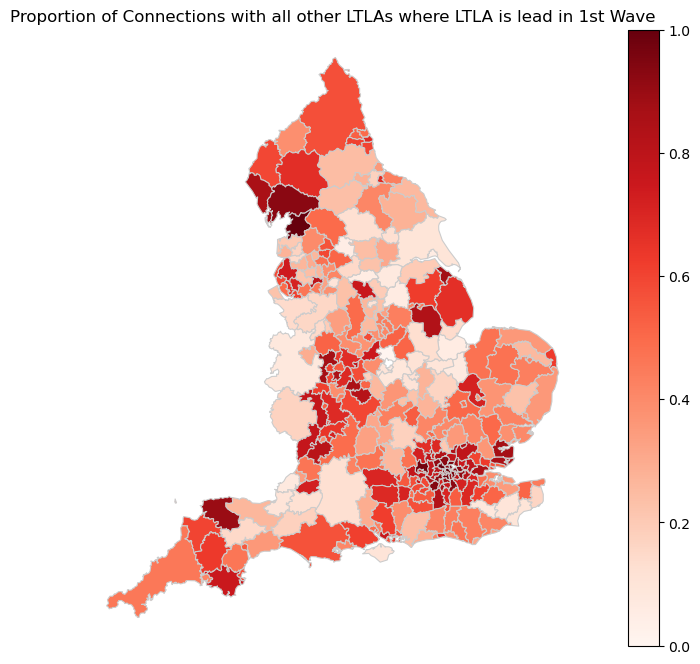

In [259]:
variable = 'Lead/Lag Proportion'
vmin, vmax = 0.0, 1
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Proportion of Connections with all other LTLAs where LTLA is lead in 1st Wave')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_lag.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

In [273]:
lead_means = lag_notzero1new.groupby(['LTLA 1'])['Maximum Correlation'].mean()

In [274]:
lead_means = pd.DataFrame(lead_means)

In [275]:
lead_means = lead_means.reset_index()

In [277]:
lead_means

,LTLA 1,Maximum Correlation
0,Adur,0.567892
1,Allerdale,0.576448
2,Amber Valley,0.538535
3,Arun,0.539555
4,Ashfield,0.564697
...,...,...
308,Wychavon,0.619555
309,Wycombe,0.525847
310,Wyre,0.584353
311,Wyre Forest,0.623058


In [276]:
lag_means = lag_notzero1new.groupby(['LTLA 2'])['Maximum Correlation'].mean()
lag_means = pd.DataFrame(lag_means)
lag_means = lag_means.reset_index()

In [266]:
lag_notzero1new.loc[lag_notzero1new['LTLA 1'] == 'Adur']

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave
169,Adur,Redcar and Cleveland,0.597545,5.0,Rural-Rural,True,415.308579,1st
481,Adur,East Devon,0.484662,3.0,Rural-Rural,True,206.183346,1st
792,Adur,Havant,0.609503,1.0,Rural-Rural,False,48.732129,1st
1411,Adur,Worthing,0.590096,3.0,Urban-Rural,False,7.040460,1st
1719,Adur,Bolton,0.568197,1.0,Urban-Rural,True,338.242570,1st
...,...,...,...,...,...,...,...,...
38979,Adur,St. Helens,0.748459,8.0,Urban-Rural,True,334.848286,1st
38981,Adur,County Durham,0.750247,10.0,Rural-Rural,True,440.844434,1st
38983,Adur,Colchester,0.678698,8.0,Urban-Rural,False,140.261111,1st
38984,Adur,Basingstoke and Deane,0.593008,7.0,Rural-Rural,False,79.145308,1st


In [278]:
map_df_means = map_df.merge(lead_means, how = 'left', left_on='LAD19NM', right_on='LTLA 1')
map_df_means = map_df_means.merge(lag_means, how = 'left', left_on='LAD19NM', right_on='LTLA 2')
map_df_means

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,LTLA 1,Maximum Correlation_x,LTLA 2,Maximum Correlation_y
0,E06000001,Hartlepool,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53...",POINT (447858.222 530775.756),Hartlepool,0.586690,Hartlepool,0.639060
1,E06000002,Middlesbrough,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51...",POINT (450414.504 516716.770),Middlesbrough,0.637129,Middlesbrough,0.671145
2,E06000003,Redcar and Cleveland,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),Redcar and Cleveland,0.636294,Redcar and Cleveland,0.635829
3,E06000004,Stockton-on-Tees,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51...",POINT (443311.722 518610.696),Stockton-on-Tees,0.615545,Stockton-on-Tees,0.630797
4,E06000005,Darlington,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51...",POINT (429079.949 517181.470),Darlington,0.587874,Darlington,0.629022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312,E09000029,Sutton,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16...",POINT (526921.511 164072.121),Sutton,0.655580,Sutton,0.713104
313,E09000030,Tower Hamlets,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18...",POINT (536284.163 181655.072),Tower Hamlets,0.647556,Tower Hamlets,0.713352
314,E09000031,Waltham Forest,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19...",POINT (537733.549 190362.653),Waltham Forest,0.656768,Waltham Forest,0.765321
315,E09000032,Wandsworth,NaN,525152,174137,-0.20021,51.4524,ae8b0119-ba95-4f3a-bf05-112793bf65c4,"POLYGON ((528519.296 175722.099, 529115.703 17...",POINT (525991.101 174101.545),Wandsworth,0.668707,Wandsworth,0.735680


In [290]:
map_df_means.nlargest(2,'Maximum Correlation_y')

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,LTLA 1,Maximum Correlation_x,LTLA 2,Maximum Correlation_y
298,E09000015,Harrow,NaN,515356,189736,-0.33603,51.5947,459d2768-0025-4df1-a827-e8a71b2e6567,"POLYGON ((517435.197 194421.097, 520113.102 19...",POINT (515027.587 190113.869),Harrow,0.691136,Harrow,0.766994
314,E09000031,Waltham Forest,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19...",POINT (537733.549 190362.653),Waltham Forest,0.656768,Waltham Forest,0.765321


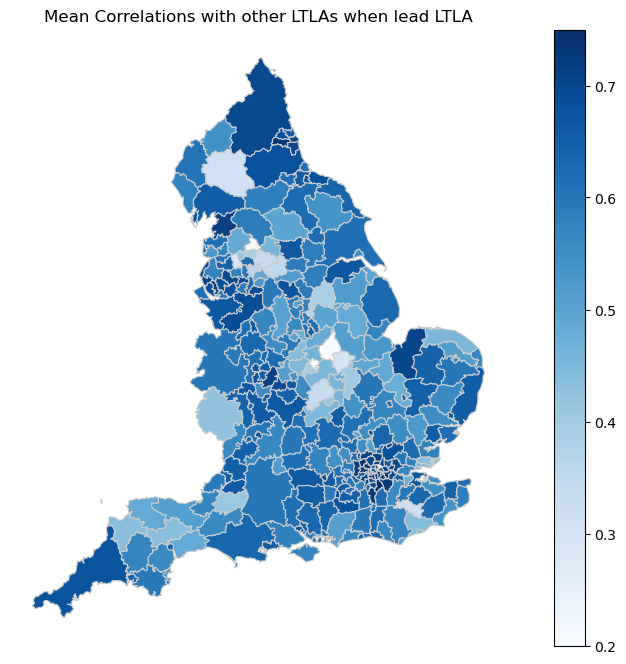

In [311]:
variable = 'Maximum Correlation_x'
vmin, vmax = 0.2, 0.75
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Mean Correlations with other LTLAs when lead LTLA')
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_means.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

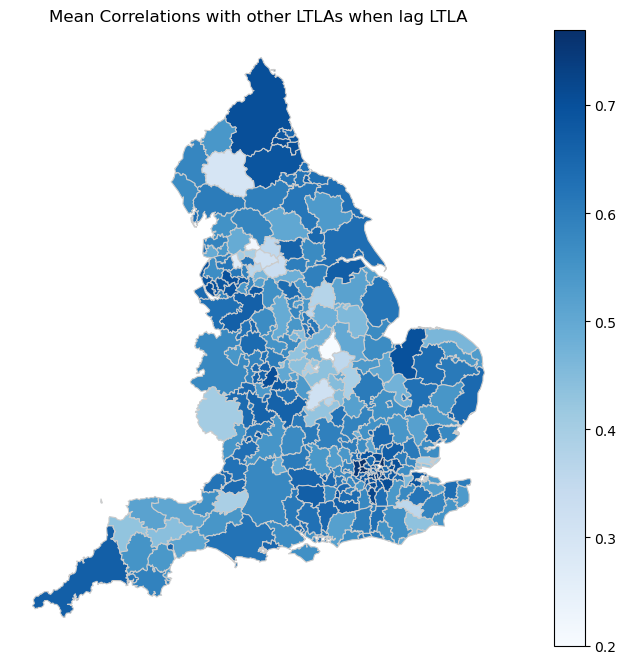

In [291]:
variable = 'Maximum Correlation_y'
vmin, vmax = 0.2, 0.77
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Mean Correlations with other LTLAs when lag LTLA')
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_means.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

In [300]:
lead_meanslags = lag_notzero1new.groupby(['LTLA 1'])['Lag in Days'].mean()
lead_meanslags = pd.DataFrame(lead_meanslags)
lead_meanslags = lead_meanslags.reset_index()

In [301]:
lag_meanslags = lag_notzero1new.groupby(['LTLA 2'])['Lag in Days'].mean()
lag_meanslags = pd.DataFrame(lag_meanslags)
lag_meanslags = lag_meanslags.reset_index()

In [303]:
map_df_meanslags = map_df.merge(lead_meanslags, how = 'left', left_on='LAD19NM', right_on='LTLA 1')
map_df_meanslags = map_df_meanslags.merge(lag_meanslags, how = 'left', left_on='LAD19NM', right_on='LTLA 2')
map_df_meanslags

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,LTLA 1,Lag in Days_x,LTLA 2,Lag in Days_y
0,E06000001,Hartlepool,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53...",POINT (447858.222 530775.756),Hartlepool,4.717172,Hartlepool,6.795322
1,E06000002,Middlesbrough,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51...",POINT (450414.504 516716.770),Middlesbrough,6.625668,Middlesbrough,4.080460
2,E06000003,Redcar and Cleveland,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),Redcar and Cleveland,5.859504,Redcar and Cleveland,7.250000
3,E06000004,Stockton-on-Tees,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51...",POINT (443311.722 518610.696),Stockton-on-Tees,5.211538,Stockton-on-Tees,6.687783
4,E06000005,Darlington,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51...",POINT (429079.949 517181.470),Darlington,5.059524,Darlington,6.700000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312,E09000029,Sutton,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16...",POINT (526921.511 164072.121),Sutton,9.144330,Sutton,5.383333
313,E09000030,Tower Hamlets,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18...",POINT (536284.163 181655.072),Tower Hamlets,10.940594,Tower Hamlets,1.500000
314,E09000031,Waltham Forest,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19...",POINT (537733.549 190362.653),Waltham Forest,9.842857,Waltham Forest,2.222222
315,E09000032,Wandsworth,NaN,525152,174137,-0.20021,51.4524,ae8b0119-ba95-4f3a-bf05-112793bf65c4,"POLYGON ((528519.296 175722.099, 529115.703 17...",POINT (525991.101 174101.545),Wandsworth,9.716216,Wandsworth,1.000000


In [308]:
map_df_meanslags.nlargest(2,'Lag in Days_y')

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,LTLA 1,Lag in Days_x,LTLA 2,Lag in Days_y
278,E08000032,Bradford,NaN,408395,438626,-1.87389,53.8438,0850c262-065e-4924-8d93-0fa8b4b655cb,"POLYGON ((397063.002 439322.305, 398667.598 44...",POINT (409716.484 438734.134),Bradford,4.166667,Bradford,13.384146
157,E07000135,Oadby and Wigston,NaN,461543,299379,-1.09300,52.5887,c6bd9781-ec73-4b04-a16c-7735c3b9e161,"POLYGON ((463026.500 302658.604, 463588.797 30...",POINT (461488.241 299325.178),Oadby and Wigston,2.400000,Oadby and Wigston,13.282353


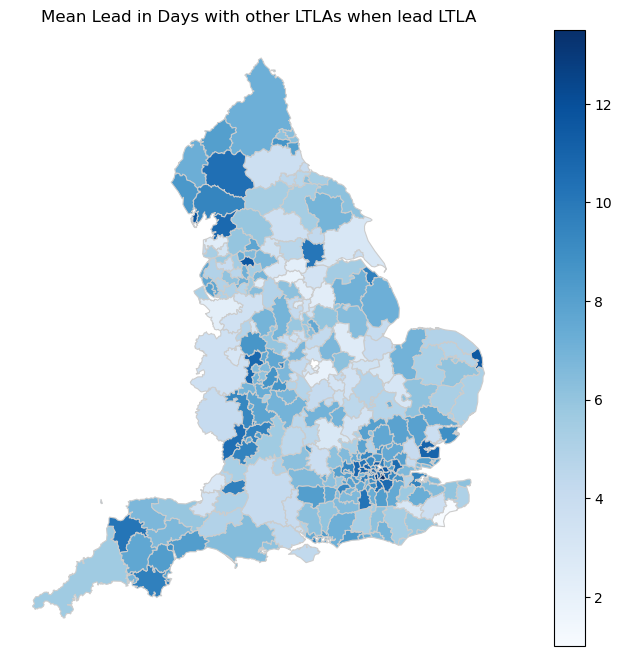

In [309]:
variable = 'Lag in Days_x'
vmin, vmax = 1.0, 13.5
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Mean Lead in Days with other LTLAs when lead LTLA')
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_meanslags.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

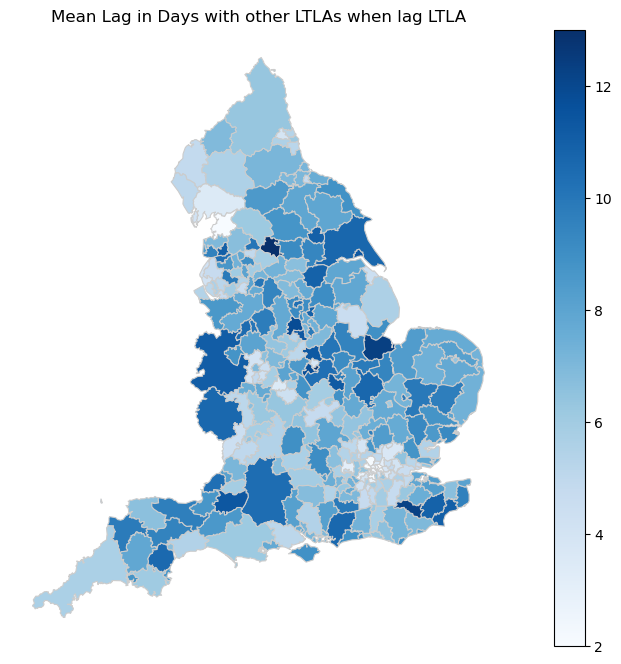

In [310]:
variable = 'Lag in Days_y'
vmin, vmax = 2.0, 13.0
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Mean Lag in Days with other LTLAs when lag LTLA')
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_meanslags.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

## 2nd Wave (Using Positive Values)

In [345]:
lag_notzero2 = lag_notzero.loc[lag_notzero['Wave'] == '2nd']

In [346]:
lag_notzero2

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave
49149,Redcar and Cleveland,Barnet,0.581888,-7.0,Rural-Rural,True,331.073858,2nd
49151,Redcar and Cleveland,Wandsworth,0.563747,-14.0,Urban-Rural,True,349.363988,2nd
49152,Redcar and Cleveland,Westminster,0.630625,-7.0,Urban-Rural,True,342.880999,2nd
49153,Redcar and Cleveland,South Bucks,0.570727,-8.0,Rural-Rural,True,334.504166,2nd
49154,Redcar and Cleveland,Braintree,0.502412,-7.0,Rural-Rural,True,309.666931,2nd
...,...,...,...,...,...,...,...,...
98251,St. Helens,Tunbridge Wells,0.658384,-13.0,Urban-Rural,True,338.180817,2nd
98253,St. Helens,Hillingdon,0.729897,-7.0,Urban-Urban,True,263.485813,2nd
98257,West Berkshire,Basingstoke and Deane,0.866583,7.0,Rural-Rural,False,20.901189,2nd
98269,South Hams,Tunbridge Wells,0.730748,-6.0,Rural-Rural,True,311.132241,2nd


In [347]:
lag_notzero2 = lag_notzero2.loc[abs(lag_notzero2['Lag in Days']) <= 21]

In [348]:
lag_notzero2

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave
49149,Redcar and Cleveland,Barnet,0.581888,-7.0,Rural-Rural,True,331.073858,2nd
49151,Redcar and Cleveland,Wandsworth,0.563747,-14.0,Urban-Rural,True,349.363988,2nd
49152,Redcar and Cleveland,Westminster,0.630625,-7.0,Urban-Rural,True,342.880999,2nd
49153,Redcar and Cleveland,South Bucks,0.570727,-8.0,Rural-Rural,True,334.504166,2nd
49154,Redcar and Cleveland,Braintree,0.502412,-7.0,Rural-Rural,True,309.666931,2nd
...,...,...,...,...,...,...,...,...
98251,St. Helens,Tunbridge Wells,0.658384,-13.0,Urban-Rural,True,338.180817,2nd
98253,St. Helens,Hillingdon,0.729897,-7.0,Urban-Urban,True,263.485813,2nd
98257,West Berkshire,Basingstoke and Deane,0.866583,7.0,Rural-Rural,False,20.901189,2nd
98269,South Hams,Tunbridge Wells,0.730748,-6.0,Rural-Rural,True,311.132241,2nd


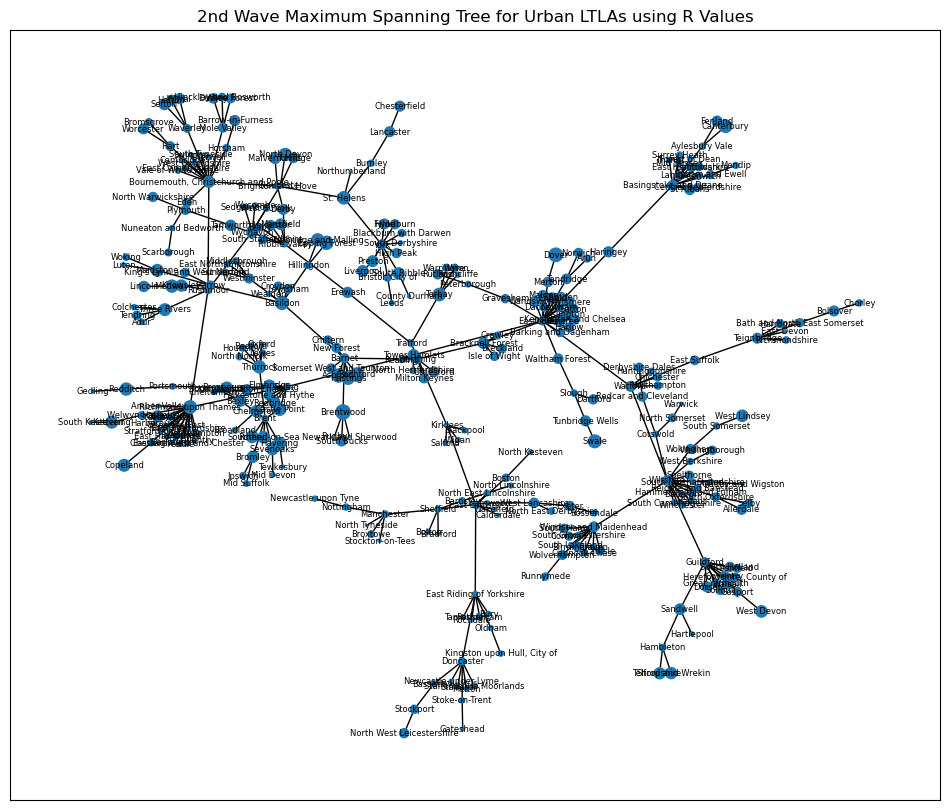

In [349]:
G = nx.from_pandas_edgelist(lag_notzero2,source = 'LTLA 1',target = 'LTLA 2', edge_attr='Maximum Correlation',)

T = nx.maximum_spanning_tree(G, weight = 'Maximum Correlation', )
#distances = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(T.nodes).keys()]
labels = {i:i for i in dict(T.nodes).keys()}


d = G.degree()
degree_values = [v for k, v in d]
deg_vals = [x * 0.5 for x in degree_values]

fig, ax = plt.subplots(figsize=(12,10))
pos = nx.spring_layout(T, seed=1)
nx.draw_networkx_nodes(T, pos, ax = ax, node_size = deg_vals, label=True)
nx.draw_networkx_edges(T, pos, arrowstyle="->", ax=ax)
nx.draw_networkx_labels(T, pos, labels, font_size = 6, ax=ax)

plt.title('2nd Wave Maximum Spanning Tree for Urban LTLAs using R Values')
plt.show()

In [362]:
lag_notzero2rep = lag_notzero2.drop(columns = ['Distance > 150km?'])

In [363]:
lag_notzero2new = lag_direction(lag_notzero2, lag_notzero2rep)

/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/1245444803.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['LTLA 1'].iloc[i] = df2['LTLA 2'].iloc[i]
/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/1245444803.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['LTLA 2'].iloc[i] = df2['LTLA 1'].iloc[i]


In [365]:
lag_notzero2new['Lag in Days'] = abs(lag_notzero2new['Lag in Days'])

/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/3775808207.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lag_notzero2new['Lag in Days'] = abs(lag_notzero2new['Lag in Days'])


In [366]:
lag_notzero2new

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave
49149,Barnet,Redcar and Cleveland,0.581888,7.0,Rural-Rural,True,331.073858,2nd
49151,Wandsworth,Redcar and Cleveland,0.563747,14.0,Urban-Rural,True,349.363988,2nd
49152,Westminster,Redcar and Cleveland,0.630625,7.0,Urban-Rural,True,342.880999,2nd
49153,South Bucks,Redcar and Cleveland,0.570727,8.0,Rural-Rural,True,334.504166,2nd
49154,Braintree,Redcar and Cleveland,0.502412,7.0,Rural-Rural,True,309.666931,2nd
...,...,...,...,...,...,...,...,...
98251,Tunbridge Wells,St. Helens,0.658384,13.0,Urban-Rural,True,338.180817,2nd
98253,Hillingdon,St. Helens,0.729897,7.0,Urban-Urban,True,263.485813,2nd
98257,West Berkshire,Basingstoke and Deane,0.866583,7.0,Rural-Rural,False,20.901189,2nd
98269,Tunbridge Wells,South Hams,0.730748,6.0,Rural-Rural,True,311.132241,2nd


In [371]:
lead_counts2 = lag_notzero2new['LTLA 1'].value_counts()

In [372]:
lead_counts_df2 = pd.DataFrame(lead_counts2)
lead_counts_df2 = lead_counts_df2.reset_index()
lead_counts_df2 = lead_counts_df2.rename(columns = {'index': 'LTLA 1', 'LTLA 1':'Lead count'})

In [373]:
lag_counts2 = lag_notzero2new['LTLA 2'].value_counts()

In [374]:
lag_counts_df2 = pd.DataFrame(lag_counts2)
lag_counts_df2 = lag_counts_df2.reset_index()
lag_counts_df2 = lag_counts_df2.rename(columns = {'index': 'LTLA 2', 'LTLA 2':'Lag count'})

In [377]:
lead_counts_df2

,LTLA 1,Lead count
0,Brentwood,211
1,Dover,186
2,Rochford,185
3,Epping Forest,176
4,Ashford,174
...,...,...
251,North Tyneside,1
252,Wychavon,1
253,Ryedale,1
254,Stockton-on-Tees,1


In [378]:
map_df_lag2 = map_df.merge(lead_counts_df2, how = 'left', left_on='LAD19NM', right_on='LTLA 1')
map_df_lag2 = map_df_lag2.merge(lag_counts_df2, how = 'left', left_on='LAD19NM', right_on='LTLA 2')

In [379]:
map_df_lag2

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,LTLA 1,Lead count,LTLA 2,Lag count
0,E06000001,Hartlepool,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53...",POINT (447858.222 530775.756),Hartlepool,17.0,Hartlepool,1.0
1,E06000002,Middlesbrough,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51...",POINT (450414.504 516716.770),Middlesbrough,1.0,Middlesbrough,39.0
2,E06000003,Redcar and Cleveland,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),Redcar and Cleveland,2.0,Redcar and Cleveland,80.0
3,E06000004,Stockton-on-Tees,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51...",POINT (443311.722 518610.696),Stockton-on-Tees,1.0,Stockton-on-Tees,9.0
4,E06000005,Darlington,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51...",POINT (429079.949 517181.470),NaN,NaN,Darlington,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312,E09000029,Sutton,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16...",POINT (526921.511 164072.121),Sutton,68.0,Sutton,5.0
313,E09000030,Tower Hamlets,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18...",POINT (536284.163 181655.072),Tower Hamlets,113.0,Tower Hamlets,1.0
314,E09000031,Waltham Forest,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19...",POINT (537733.549 190362.653),Waltham Forest,88.0,Waltham Forest,1.0
315,E09000032,Wandsworth,NaN,525152,174137,-0.20021,51.4524,ae8b0119-ba95-4f3a-bf05-112793bf65c4,"POLYGON ((528519.296 175722.099, 529115.703 17...",POINT (525991.101 174101.545),Wandsworth,93.0,Wandsworth,5.0


In [380]:
map_df_lag2['Lead/Lag Proportion'] = map_df_lag2['Lead count'] / (map_df_lag2['Lead count'] + map_df_lag2['Lag count'])

In [382]:
map_df_lag2["Lead/Lag Proportion"] = map_df_lag2["Lead/Lag Proportion"].fillna(0)

In [388]:
map_df_lag2[["Lead count","Lag count"]] = map_df_lag2[["Lead count","Lag count"]].fillna(0)

In [389]:
map_df_lag2.nlargest(2,'Lead count')

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,LTLA 1,Lead count,LTLA 2,Lag count,Lead/Lag Proportion
94,E07000068,Brentwood,NaN,558560,196070,0.290091,51.6411,bf7dc1a2-d3f7-40c8-99d3-06db7bf6fd2e,"POLYGON ((561328.002 204608.901, 562283.300 20...",POINT (559944.908 195889.553),Brentwood,211.0,Brentwood,1.0,0.995283
130,E07000108,Dover,NaN,628967,150940,1.276930,51.2117,0d3a9442-1bd3-444f-b5c5-899adeee3671,"POLYGON ((633132.280 161896.825, 634486.487 16...",POINT (629721.459 150961.455),Dover,186.0,Dover,1.0,0.994652


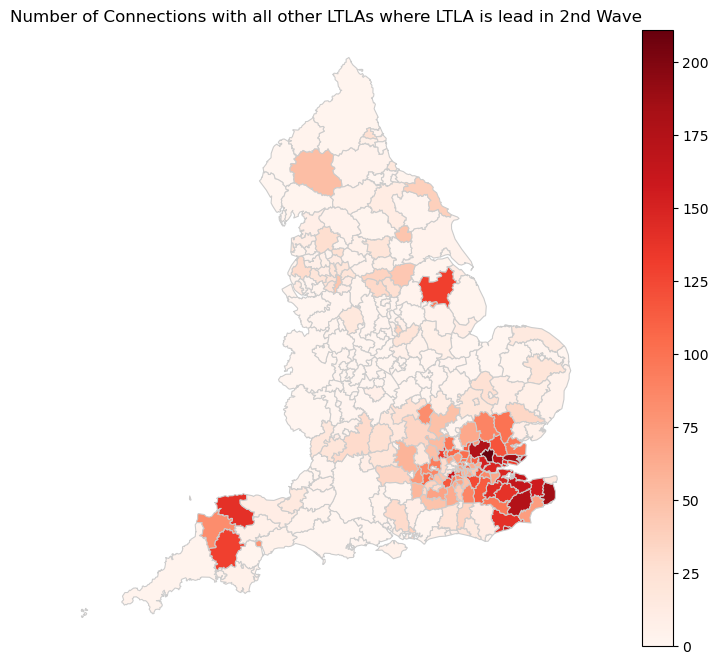

In [390]:
variable = 'Lead count'
vmin, vmax = 0.0, 211.0
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Number of Connections with all other LTLAs where LTLA is lead in 2nd Wave')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_lag2.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

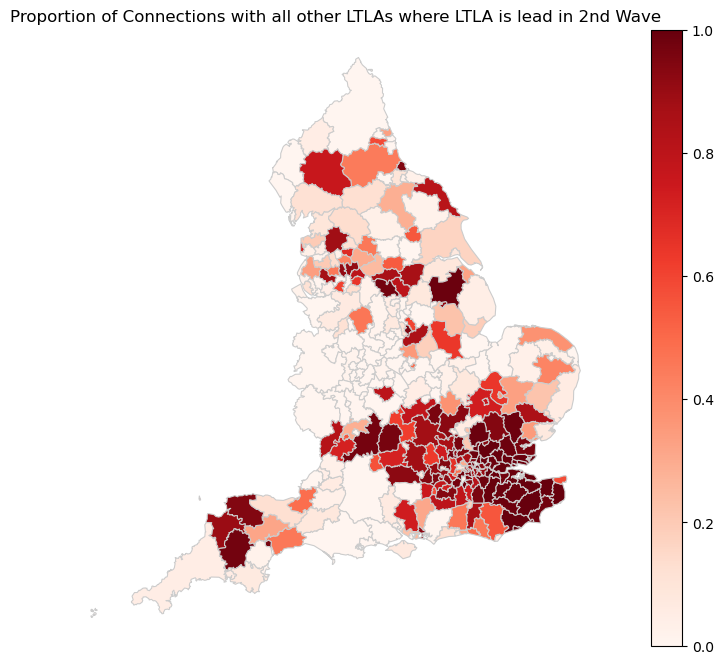

In [391]:
variable = 'Lead/Lag Proportion'
vmin, vmax = 0.0, 1
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Proportion of Connections with all other LTLAs where LTLA is lead in 2nd Wave')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_lag2.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

Above cartograms reflects the fact that COVID-19 variant that caused 2nd wave originated in Kent.

In [386]:
lead_means2 = lag_notzero2new.groupby(['LTLA 1'])['Maximum Correlation'].mean()
lead_means2 = pd.DataFrame(lead_means2)
lead_means2 = lead_means2.reset_index()

In [385]:
lag_means2 = lag_notzero2new.groupby(['LTLA 2'])['Maximum Correlation'].mean()
lag_means2 = pd.DataFrame(lag_means2)
lag_means2 = lag_means2.reset_index()

In [387]:
lead_means2

,LTLA 1,Maximum Correlation
0,Adur,0.692379
1,Amber Valley,0.520728
2,Arun,0.714610
3,Ashford,0.734607
4,Aylesbury Vale,0.752303
...,...,...
251,Worthing,0.664670
252,Wychavon,0.524168
253,Wycombe,0.731674
254,Wyre,0.620392


In [392]:
map_df_means2 = map_df.merge(lead_means2, how = 'left', left_on='LAD19NM', right_on='LTLA 1')
map_df_means2 = map_df_means2.merge(lag_means2, how = 'left', left_on='LAD19NM', right_on='LTLA 2')
map_df_means2

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,LTLA 1,Maximum Correlation_x,LTLA 2,Maximum Correlation_y
0,E06000001,Hartlepool,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53...",POINT (447858.222 530775.756),Hartlepool,0.734878,Hartlepool,0.724682
1,E06000002,Middlesbrough,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51...",POINT (450414.504 516716.770),Middlesbrough,0.382985,Middlesbrough,0.617179
2,E06000003,Redcar and Cleveland,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),Redcar and Cleveland,0.567715,Redcar and Cleveland,0.553033
3,E06000004,Stockton-on-Tees,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51...",POINT (443311.722 518610.696),Stockton-on-Tees,0.522195,Stockton-on-Tees,0.519947
4,E06000005,Darlington,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51...",POINT (429079.949 517181.470),NaN,NaN,Darlington,0.579938
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312,E09000029,Sutton,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16...",POINT (526921.511 164072.121),Sutton,0.750182,Sutton,0.686955
313,E09000030,Tower Hamlets,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18...",POINT (536284.163 181655.072),Tower Hamlets,0.751519,Tower Hamlets,0.578312
314,E09000031,Waltham Forest,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19...",POINT (537733.549 190362.653),Waltham Forest,0.738747,Waltham Forest,0.586395
315,E09000032,Wandsworth,NaN,525152,174137,-0.20021,51.4524,ae8b0119-ba95-4f3a-bf05-112793bf65c4,"POLYGON ((528519.296 175722.099, 529115.703 17...",POINT (525991.101 174101.545),Wandsworth,0.748469,Wandsworth,0.694223


In [393]:
map_df_means2[["Maximum Correlation_x","Maximum Correlation_y"]] = map_df_means2[["Maximum Correlation_x","Maximum Correlation_y"]].fillna(0)

In [396]:
map_df_means2.nlargest(2, 'Maximum Correlation_y')

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,LTLA 1,Maximum Correlation_x,LTLA 2,Maximum Correlation_y
245,E07000244,East Suffolk,NaN,636039,266218,1.45609,52.2435,872eae4b-d0ab-4d0e-8a0d-08bef0205194,"POLYGON ((651106.502 300527.104, 652813.502 29...",POINT (636509.552 265715.850),East Suffolk,0.679988,East Suffolk,0.865027
110,E07000084,Basingstoke and Deane,NaN,454508,151423,-1.22021,51.2594,e22fc013-2390-4ae8-9098-80b82298382b,"POLYGON ((439824.503 159869.997, 438804.704 16...",POINT (455884.552 152949.361),NaN,0.000000,Basingstoke and Deane,0.862553


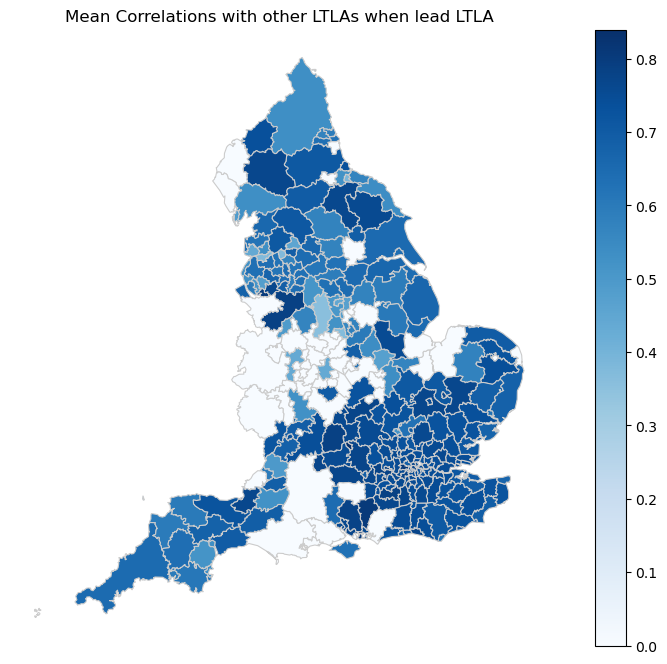

In [395]:
variable = 'Maximum Correlation_x'
vmin, vmax = 0.0, 0.84
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Mean Correlations with other LTLAs when lead LTLA')
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_means2.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

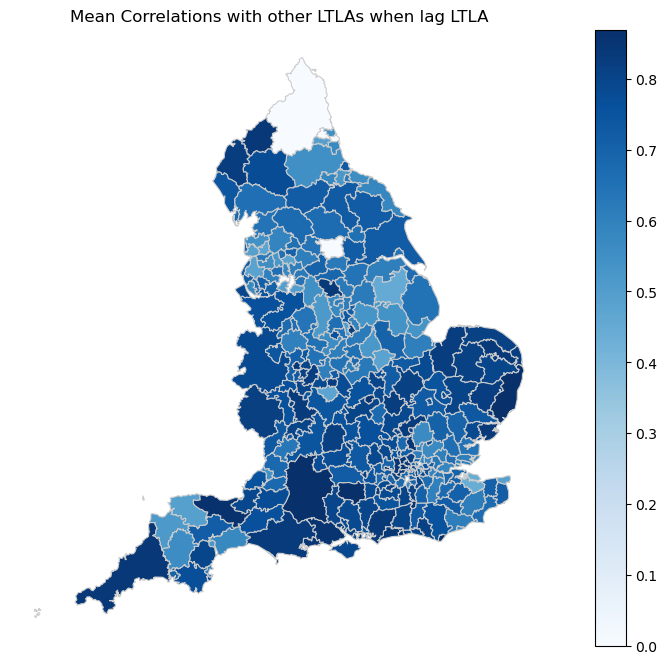

In [397]:
variable = 'Maximum Correlation_y'
vmin, vmax = 0.0, 0.87
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Mean Correlations with other LTLAs when lag LTLA')
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_means2.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

In [398]:
lead_meanslags2 = lag_notzero2new.groupby(['LTLA 1'])['Lag in Days'].mean()
lead_meanslags2 = pd.DataFrame(lead_meanslags2)
lead_meanslags2 = lead_meanslags2.reset_index()

In [399]:
lag_meanslags2 = lag_notzero2new.groupby(['LTLA 2'])['Lag in Days'].mean()
lag_meanslags2 = pd.DataFrame(lag_meanslags2)
lag_meanslags2 = lag_meanslags2.reset_index()

In [401]:
map_df_meanslags2 = map_df.merge(lead_meanslags2, how = 'left', left_on='LAD19NM', right_on='LTLA 1')
map_df_meanslags2 = map_df_meanslags2.merge(lag_meanslags2, how = 'left', left_on='LAD19NM', right_on='LTLA 2')
map_df_meanslags2

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,LTLA 1,Lag in Days_x,LTLA 2,Lag in Days_y
0,E06000001,Hartlepool,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53...",POINT (447858.222 530775.756),Hartlepool,7.058824,Hartlepool,7.000000
1,E06000002,Middlesbrough,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51...",POINT (450414.504 516716.770),Middlesbrough,7.000000,Middlesbrough,10.333333
2,E06000003,Redcar and Cleveland,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),Redcar and Cleveland,4.000000,Redcar and Cleveland,9.050000
3,E06000004,Stockton-on-Tees,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51...",POINT (443311.722 518610.696),Stockton-on-Tees,21.000000,Stockton-on-Tees,10.000000
4,E06000005,Darlington,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51...",POINT (429079.949 517181.470),NaN,NaN,Darlington,7.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312,E09000029,Sutton,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16...",POINT (526921.511 164072.121),Sutton,7.220588,Sutton,12.600000
313,E09000030,Tower Hamlets,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18...",POINT (536284.163 181655.072),Tower Hamlets,8.123894,Tower Hamlets,7.000000
314,E09000031,Waltham Forest,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19...",POINT (537733.549 190362.653),Waltham Forest,8.329545,Waltham Forest,15.000000
315,E09000032,Wandsworth,NaN,525152,174137,-0.20021,51.4524,ae8b0119-ba95-4f3a-bf05-112793bf65c4,"POLYGON ((528519.296 175722.099, 529115.703 17...",POINT (525991.101 174101.545),Wandsworth,8.774194,Wandsworth,8.600000


In [402]:
map_df_meanslags2[["Lag in Days_x","Lag in Days_y"]] = map_df_meanslags2[["Lag in Days_x","Lag in Days_y"]].fillna(0)

In [406]:
map_df_meanslags2.nlargest(2,'Lag in Days_y')

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,LTLA 1,Lag in Days_x,LTLA 2,Lag in Days_y
94,E07000068,Brentwood,NaN,558560,196070,0.290091,51.6411,bf7dc1a2-d3f7-40c8-99d3-06db7bf6fd2e,"POLYGON ((561328.002 204608.901, 562283.300 20...",POINT (559944.908 195889.553),Brentwood,11.398104,Brentwood,21.0
128,E07000106,Canterbury,NaN,616026,158096,1.096260,51.2810,4b3e08a8-a23f-4ddf-ba54-b08e4e2bdd10,"POLYGON ((624465.001 169409.200, 624888.700 16...",POINT (616656.042 158121.991),Canterbury,12.339744,Canterbury,21.0


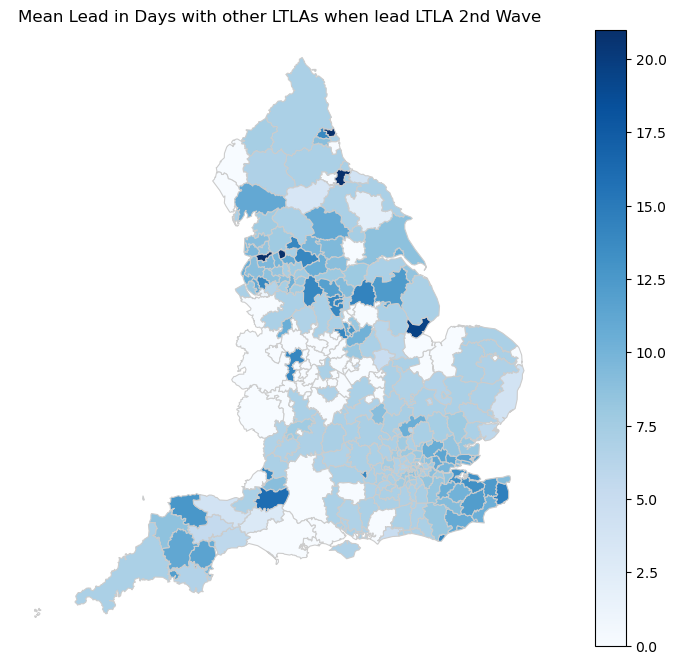

In [477]:
variable = 'Lag in Days_x'
vmin, vmax = 0.0, 21.0
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Mean Lead in Days with other LTLAs when lead LTLA 2nd Wave')
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_meanslags2.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

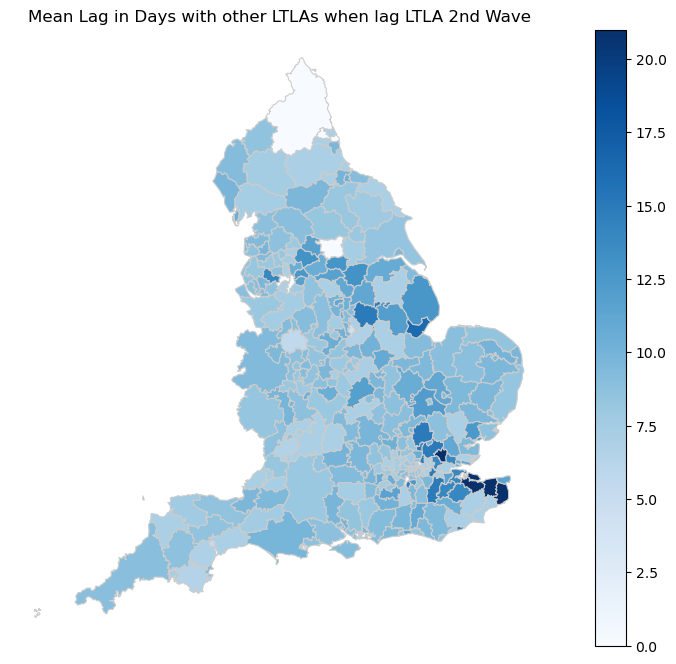

In [478]:
variable = 'Lag in Days_y'
vmin, vmax = 0.0, 21.0
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Mean Lag in Days with other LTLAs when lag LTLA 2nd Wave')
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_meanslags2.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

## 2nd Wave (Using R Values)

In [408]:
secondwave_r = pd.read_csv('Second_Wave_R.csv')

In [442]:
secondwave_r['LTLA 1'] = secondwave_r['LTLA 1'].replace(['Cornwall and Isles of Scilly'], 'Cornwall')
secondwave_r['LTLA 2'] = secondwave_r['LTLA 2'].replace(['Cornwall and Isles of Scilly'], 'Cornwall')

In [443]:
lag_notzero2r = secondwave_r.loc[secondwave_r['Lag in Days'] != 0]

In [444]:
lag_notzero2r

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
0,Redcar and Cleveland,East Devon,0.510294,2.0
1,Redcar and Cleveland,Havant,0.513457,1.0
4,Redcar and Cleveland,Bolton,0.681294,2.0
5,Redcar and Cleveland,Trafford,0.730967,1.0
8,Redcar and Cleveland,Barnet,0.538393,2.0
...,...,...,...,...
49450,Basingstoke and Deane,Rushcliffe,0.586482,-3.0
49451,Basingstoke and Deane,Hillingdon,0.785477,-9.0
49452,Tunbridge Wells,Rushcliffe,0.376819,2.0
49453,Tunbridge Wells,Hillingdon,0.583710,-2.0


In [445]:
lag_notzero2r = lag_notzero2r.loc[abs(lag_notzero2r['Lag in Days']) <= 21]

In [446]:
lag_notzero2rrep = lag_notzero2r.drop(columns = ['Lag in Days'])

In [447]:
lag_notzero2rnew= lag_direction(lag_notzero2r, lag_notzero2rrep)

/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/1245444803.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['LTLA 1'].iloc[i] = df2['LTLA 2'].iloc[i]
/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/1245444803.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['LTLA 2'].iloc[i] = df2['LTLA 1'].iloc[i]


In [448]:
lag_notzero2rnew['Lag in Days'] = abs(lag_notzero2rnew['Lag in Days'])

/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/3314031279.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lag_notzero2rnew['Lag in Days'] = abs(lag_notzero2rnew['Lag in Days'])


In [449]:
lead_counts2r = lag_notzero2rnew['LTLA 1'].value_counts()

In [450]:
lead_counts_df2r = pd.DataFrame(lead_counts2r)
lead_counts_df2r = lead_counts_df2r.reset_index()
lead_counts_df2r = lead_counts_df2r.rename(columns = {'index': 'LTLA 1', 'LTLA 1':'Lead count'})

In [451]:
lag_counts2r = lag_notzero2rnew['LTLA 2'].value_counts()

In [452]:
lag_counts_df2r = pd.DataFrame(lag_counts2r)
lag_counts_df2r = lag_counts_df2r.reset_index()
lag_counts_df2r = lag_counts_df2r.rename(columns = {'index': 'LTLA 2', 'LTLA 2':'Lag count'})

In [453]:
map_df_lag2r = map_df.merge(lead_counts_df2r, how = 'left', left_on='LAD19NM', right_on='LTLA 1')
map_df_lag2r = map_df_lag2r.merge(lag_counts_df2r, how = 'left', left_on='LAD19NM', right_on='LTLA 2')

In [454]:
map_df_lag2r

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,LTLA 1,Lead count,LTLA 2,Lag count
0,E06000001,Hartlepool,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53...",POINT (447858.222 530775.756),Hartlepool,215.0,Hartlepool,34.0
1,E06000002,Middlesbrough,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51...",POINT (450414.504 516716.770),Middlesbrough,222.0,Middlesbrough,41.0
2,E06000003,Redcar and Cleveland,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),Redcar and Cleveland,155.0,Redcar and Cleveland,58.0
3,E06000004,Stockton-on-Tees,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51...",POINT (443311.722 518610.696),Stockton-on-Tees,189.0,Stockton-on-Tees,41.0
4,E06000005,Darlington,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51...",POINT (429079.949 517181.470),Darlington,197.0,Darlington,51.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312,E09000029,Sutton,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16...",POINT (526921.511 164072.121),Sutton,169.0,Sutton,33.0
313,E09000030,Tower Hamlets,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18...",POINT (536284.163 181655.072),Tower Hamlets,218.0,Tower Hamlets,32.0
314,E09000031,Waltham Forest,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19...",POINT (537733.549 190362.653),Waltham Forest,260.0,Waltham Forest,15.0
315,E09000032,Wandsworth,NaN,525152,174137,-0.20021,51.4524,ae8b0119-ba95-4f3a-bf05-112793bf65c4,"POLYGON ((528519.296 175722.099, 529115.703 17...",POINT (525991.101 174101.545),Wandsworth,144.0,Wandsworth,57.0


In [455]:
map_df_lag2r[["Lead count","Lag count"]] = map_df_lag2r[["Lead count","Lag count"]].fillna(0)

In [456]:
map_df_lag2r['Lead/Lag Proportion'] = map_df_lag2r['Lead count'] / (map_df_lag2r['Lead count'] + map_df_lag2r['Lag count'])

In [457]:
map_df_lag2r[["Lead/Lag Proportion"]] = map_df_lag2r[["Lead/Lag Proportion"]].fillna(0)

In [459]:
map_df_lag2r.nsmallest(2,'Lead count')

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,LTLA 1,Lead count,LTLA 2,Lag count,Lead/Lag Proportion
49,E06000053,Isles of Scilly,NaN,91327,11447,-6.30217,49.9233,93f50e1a-542f-499f-85ea-3365a54d5e5b,"MULTIPOLYGON (((92817.200 15013.600, 91433.700...",POINT (90560.943 12659.065),NaN,0.0,NaN,0.0,0.0
284,E09000001,City of London,NaN,532382,181358,-0.09351,51.5156,1f8b4af9-6e0a-45fc-8154-6306fec75376,"POLYGON ((531554.600 181659.100, 532946.103 18...",POINT (532388.636 181171.053),NaN,0.0,NaN,0.0,0.0


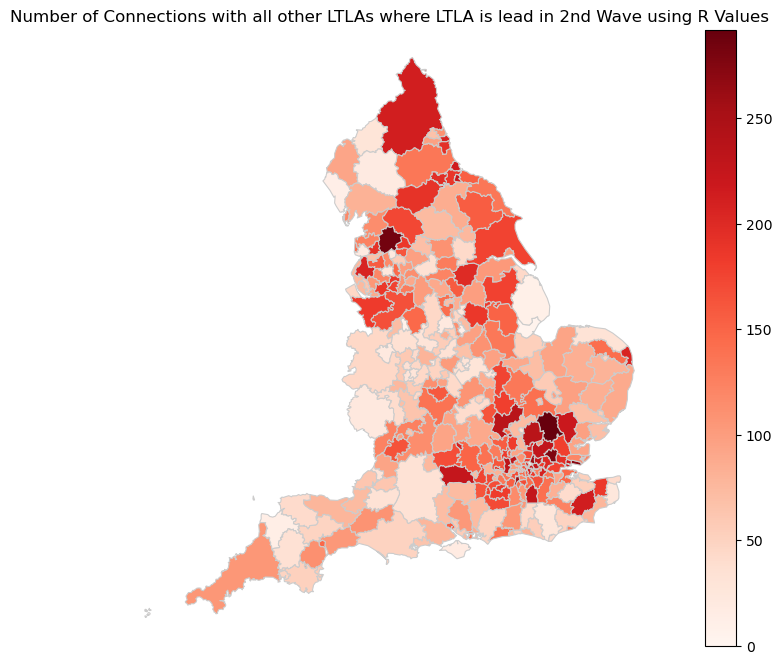

In [460]:
variable = 'Lead count'
vmin, vmax = 0.0, 292.0
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Number of Connections with all other LTLAs where LTLA is lead in 2nd Wave using R Values')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_lag2r.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

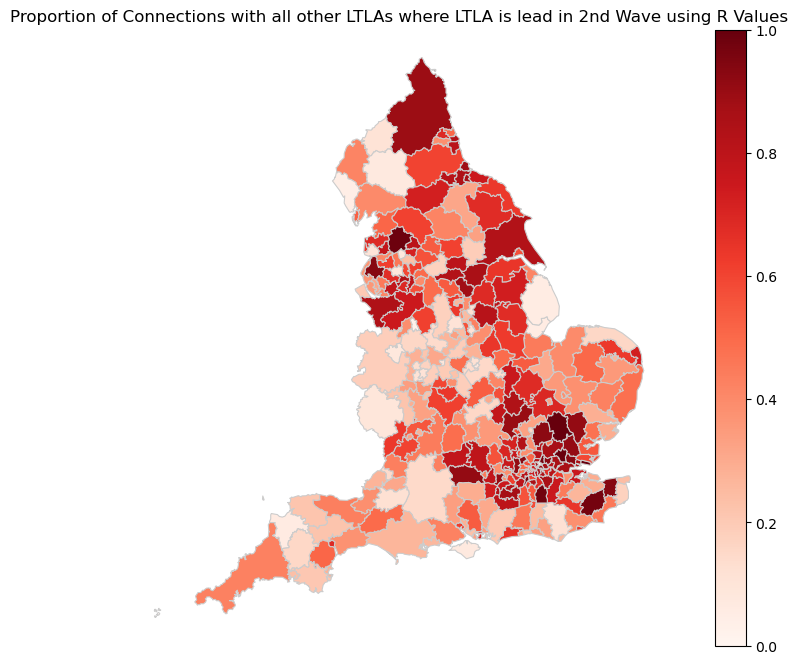

In [461]:
variable = 'Lead/Lag Proportion'
vmin, vmax = 0.0, 1.0
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Proportion of Connections with all other LTLAs where LTLA is lead in 2nd Wave using R Values')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_lag2r.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

In [462]:
lead_means2r = lag_notzero2rnew.groupby(['LTLA 1'])['Maximum Correlation'].mean()
lead_means2r = pd.DataFrame(lead_means2r)
lead_means2r = lead_means2r.reset_index()

In [463]:
lag_means2r = lag_notzero2rnew.groupby(['LTLA 2'])['Maximum Correlation'].mean()
lag_means2r = pd.DataFrame(lag_means2r)
lag_means2r = lag_means2r.reset_index()

In [464]:
map_df_means2r = map_df.merge(lead_means2r, how = 'left', left_on='LAD19NM', right_on='LTLA 1')
map_df_means2r = map_df_means2r.merge(lag_means2r, how = 'left', left_on='LAD19NM', right_on='LTLA 2')


In [465]:
map_df_means2r[["Maximum Correlation_x","Maximum Correlation_y"]] = map_df_means2r[["Maximum Correlation_x","Maximum Correlation_y"]].fillna(0)

In [466]:
map_df_means2r.nsmallest(5,'Maximum Correlation_y')

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,LTLA 1,Maximum Correlation_x,LTLA 2,Maximum Correlation_y
49,E06000053,Isles of Scilly,NaN,91327,11447,-6.30217,49.9233,93f50e1a-542f-499f-85ea-3365a54d5e5b,"MULTIPOLYGON (((92817.200 15013.600, 91433.700...",POINT (90560.943 12659.065),NaN,0.000000,NaN,0.000000
284,E09000001,City of London,NaN,532382,181358,-0.09351,51.5156,1f8b4af9-6e0a-45fc-8154-6306fec75376,"POLYGON ((531554.600 181659.100, 532946.103 18...",POINT (532388.636 181171.053),NaN,0.000000,NaN,0.000000
295,E09000012,Hackney,NaN,534560,185787,-0.06045,51.5549,62b898ea-f14d-40b8-b303-20a20a17717a,"POLYGON ((534444.098 188327.401, 535464.202 18...",POINT (534327.292 185470.723),NaN,0.000000,NaN,0.000000
162,E07000140,South Holland,NaN,532909,322928,-0.03058,52.7876,9ff99ae6-c560-448e-9eac-f77b2fb89996,"POLYGON ((517952.797 338261.103, 521663.998 33...",POINT (531738.248 322962.448),South Holland,0.516696,South Holland,0.376173
155,E07000133,Melton,NaN,477328,323472,-0.85440,52.8033,559d6809-fb6e-430c-a130-0b8dccb61244,"POLYGON ((479358.804 340992.801, 479845.996 34...",POINT (477258.421 322622.492),Melton,0.531623,Melton,0.399406


In [469]:
map_df_means2r = map_df_means2r.drop(map_df_means2.index[49])
map_df_means2r = map_df_means2r.drop(map_df_means2.index[284])
map_df_means2r = map_df_means2r.drop(map_df_means2.index[295])

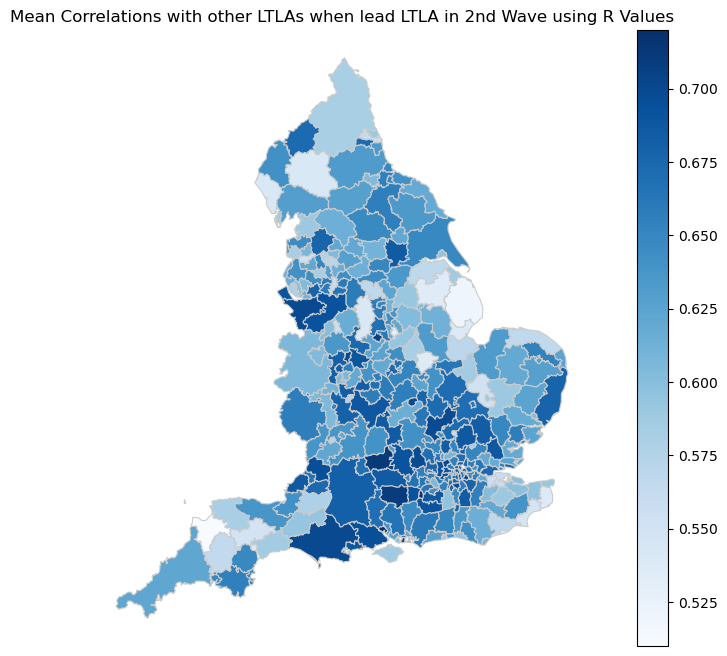

In [470]:
variable = 'Maximum Correlation_x'
vmin, vmax = 0.51, 0.72
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Mean Correlations with other LTLAs when lead LTLA in 2nd Wave using R Values')
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_means2r.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

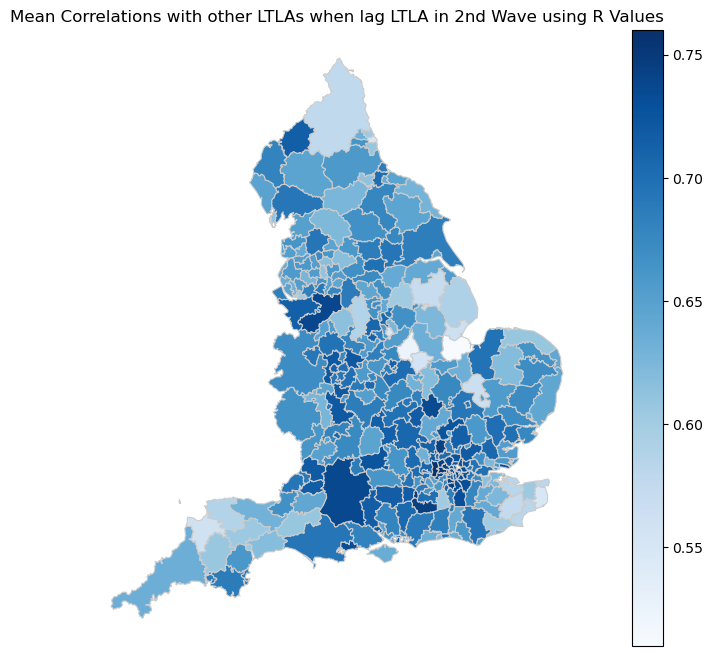

In [472]:
variable = 'Maximum Correlation_y'
vmin, vmax = 0.51, 0.76
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Mean Correlations with other LTLAs when lag LTLA in 2nd Wave using R Values')
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_means2r.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

In [473]:
lead_meanslags2r = lag_notzero2rnew.groupby(['LTLA 1'])['Lag in Days'].mean()
lead_meanslags2r = pd.DataFrame(lead_meanslags2r)
lead_meanslags2r = lead_meanslags2r.reset_index()

In [474]:
lag_meanslags2r = lag_notzero2rnew.groupby(['LTLA 2'])['Lag in Days'].mean()
lag_meanslags2r = pd.DataFrame(lag_meanslags2r)
lag_meanslags2r = lag_meanslags2r.reset_index()

In [475]:
map_df_meanslags2r = map_df.merge(lead_meanslags2r, how = 'left', left_on='LAD19NM', right_on='LTLA 1')
map_df_meanslags2r = map_df_meanslags2r.merge(lag_meanslags2r, how = 'left', left_on='LAD19NM', right_on='LTLA 2')
map_df_meanslags2r

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,LTLA 1,Lag in Days_x,LTLA 2,Lag in Days_y
0,E06000001,Hartlepool,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53...",POINT (447858.222 530775.756),Hartlepool,2.604651,Hartlepool,1.852941
1,E06000002,Middlesbrough,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51...",POINT (450414.504 516716.770),Middlesbrough,2.896396,Middlesbrough,4.951220
2,E06000003,Redcar and Cleveland,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),Redcar and Cleveland,1.967742,Redcar and Cleveland,5.913793
3,E06000004,Stockton-on-Tees,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51...",POINT (443311.722 518610.696),Stockton-on-Tees,2.513228,Stockton-on-Tees,1.634146
4,E06000005,Darlington,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51...",POINT (429079.949 517181.470),Darlington,3.730964,Darlington,8.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312,E09000029,Sutton,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16...",POINT (526921.511 164072.121),Sutton,3.745562,Sutton,1.484848
313,E09000030,Tower Hamlets,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18...",POINT (536284.163 181655.072),Tower Hamlets,4.426606,Tower Hamlets,1.531250
314,E09000031,Waltham Forest,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19...",POINT (537733.549 190362.653),Waltham Forest,6.023077,Waltham Forest,1.266667
315,E09000032,Wandsworth,NaN,525152,174137,-0.20021,51.4524,ae8b0119-ba95-4f3a-bf05-112793bf65c4,"POLYGON ((528519.296 175722.099, 529115.703 17...",POINT (525991.101 174101.545),Wandsworth,5.375000,Wandsworth,1.578947


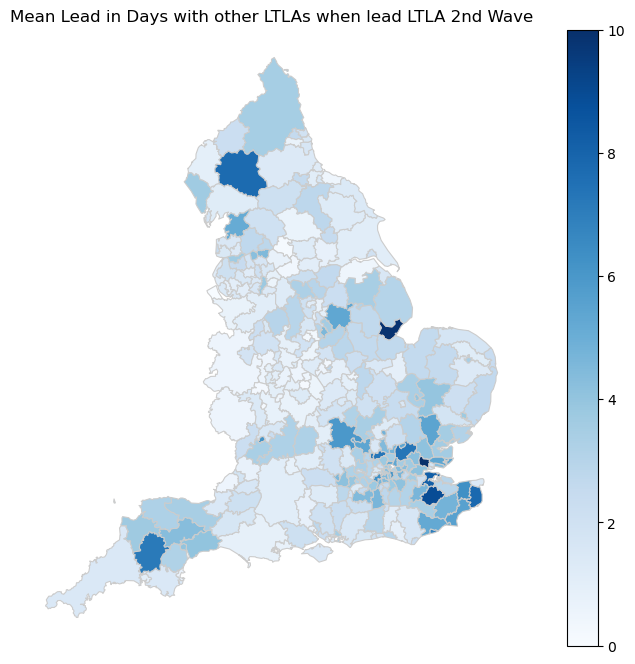

In [479]:
variable = 'Lag in Days_x'
vmin, vmax = 0.0, 10.0
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Mean Lead in Days with other LTLAs when lead LTLA 2nd Wave using R Values')
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_meanslags2r.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

In [480]:
map_df_meanslags2r.nlargest(2,'Lag in Days_y')

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,LTLA 1,Lag in Days_x,LTLA 2,Lag in Days_y
160,E07000138,Lincoln,NaN,496347,370096,-0.55848,53.2192,b617e9c8-30b0-459b-a949-0237595f55d0,"POLYGON ((493845.104 372934.798, 499217.396 37...",POINT (496539.895 370593.008),Lincoln,4.172619,Lincoln,10.666667
114,E07000088,Gosport,NaN,458773,101094,-1.16725,50.8064,4a5b16d6-d619-460d-86c3-c78740242bc9,"POLYGON ((458192.802 104816.311, 459782.600 10...",POINT (459238.429 100900.461),Gosport,2.500000,Gosport,10.469512


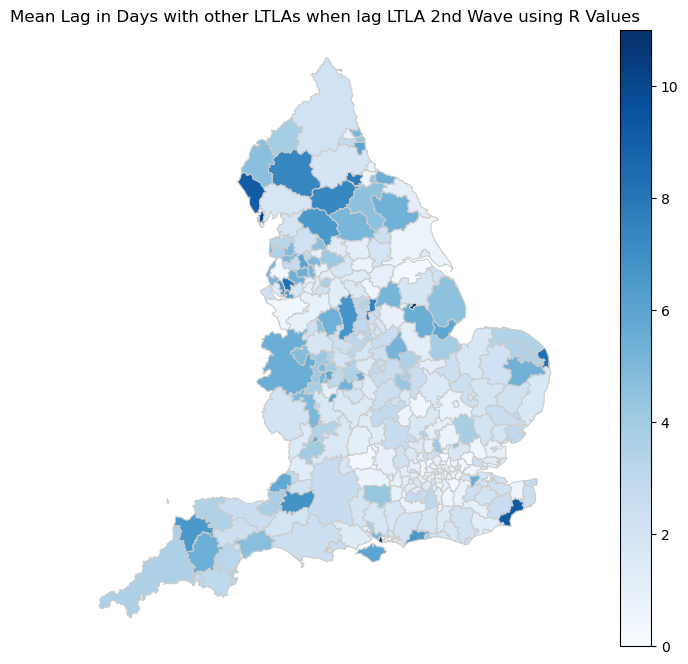

In [481]:
variable = 'Lag in Days_y'
vmin, vmax = 0.0, 11.0
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Mean Lag in Days with other LTLAs when lag LTLA 2nd Wave using R Values')
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_meanslags2r.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

## 3rd Wave (Positive Values)

In [496]:
lag_notzero3 = lag_notzero.loc[lag_notzero['Wave'] == '3rd']

In [497]:
lag_notzero3 = lag_notzero3.loc[abs(lag_notzero3['Lag in Days']) <= 21]

In [498]:
lag_notzero3rep = lag_notzero3.drop(columns = ['Distance > 150km?'])

In [499]:
lag_notzero3new = lag_direction(lag_notzero3, lag_notzero3rep)

/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/1245444803.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['LTLA 1'].iloc[i] = df2['LTLA 2'].iloc[i]
/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/1245444803.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['LTLA 2'].iloc[i] = df2['LTLA 1'].iloc[i]


In [500]:
lag_notzero3new

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Urban/Rural,Distance > 150km?,Distance between centroids,Wave
98287,Trafford,Redcar and Cleveland,0.833387,-7.0,Rural-Rural,True,153.477550,3rd
98290,Barnet,Redcar and Cleveland,0.746250,-7.0,Rural-Rural,True,331.073858,3rd
98292,Wandsworth,Redcar and Cleveland,0.797265,-14.0,Urban-Rural,True,349.363988,3rd
98293,Westminster,Redcar and Cleveland,0.772445,-14.0,Urban-Rural,True,342.880999,3rd
98295,Braintree,Redcar and Cleveland,0.757613,-7.0,Rural-Rural,True,309.666931,3rd
...,...,...,...,...,...,...,...,...
147361,Tandridge,County Durham,0.749916,7.0,Rural-Rural,True,404.284577,3rd
147380,Stevenage,County Durham,0.830321,7.0,Urban-Rural,True,329.421408,3rd
147388,St. Helens,County Durham,0.875165,7.0,Urban-Rural,False,149.145117,3rd
147403,Colchester,County Durham,0.767533,-7.0,Urban-Rural,True,361.568810,3rd


In [501]:
lag_notzero3new['Lag in Days'] = abs(lag_notzero3new['Lag in Days'])

In [502]:
lead_counts3 = lag_notzero3new['LTLA 1'].value_counts()
lead_counts_df3 = pd.DataFrame(lead_counts3)
lead_counts_df3 = lead_counts_df3.reset_index()
lead_counts_df3 = lead_counts_df3.rename(columns = {'index': 'LTLA 1', 'LTLA 1':'Lead count'})

In [503]:
lag_counts3 = lag_notzero3new['LTLA 2'].value_counts()
lag_counts_df3 = pd.DataFrame(lag_counts3)
lag_counts_df3 = lag_counts_df3.reset_index()
lag_counts_df3 = lag_counts_df3.rename(columns = {'index': 'LTLA 2', 'LTLA 2':'Lag count'})

In [504]:
lag_counts_df3

,LTLA 2,Lag count
0,Sunderland,111
1,Bradford,110
2,South Tyneside,106
3,Middlesbrough,95
4,Darlington,83
...,...,...
243,South Cambridgeshire,1
244,Broxbourne,1
245,Redbridge,1
246,Dacorum,1


In [505]:
map_df_lag3 = map_df.merge(lead_counts_df3, how = 'left', left_on='LAD19NM', right_on='LTLA 1')
map_df_lag3 = map_df_lag3.merge(lag_counts_df3, how = 'left', left_on='LAD19NM', right_on='LTLA 2')

In [506]:
map_df_lag3[["Lead count","Lag count"]] = map_df_lag3[["Lead count","Lag count"]].fillna(0)

In [507]:
map_df_lag3['Lead/Lag Proportion'] = map_df_lag3['Lead count'] / (map_df_lag3['Lead count'] + map_df_lag3['Lag count'])

In [508]:
map_df_lag3["Lead/Lag Proportion"] = map_df_lag3["Lead/Lag Proportion"].fillna(0)

In [511]:
map_df_lag3.nlargest(2,'Lag count')

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,LTLA 1,Lead count,LTLA 2,Lag count,Lead/Lag Proportion
270,E08000024,Sunderland,NaN,436470,551525,-1.43344,54.8572,7edb3546-b265-4804-afb7-574bc2465cb8,"POLYGON ((430141.504 553813.648, 428216.504 55...",POINT (435329.137 554050.693),NaN,0.0,Sunderland,111.0,0.0
278,E08000032,Bradford,NaN,408395,438626,-1.87389,53.8438,0850c262-065e-4924-8d93-0fa8b4b655cb,"POLYGON ((397063.002 439322.305, 398667.598 44...",POINT (409716.484 438734.134),NaN,0.0,Bradford,110.0,0.0


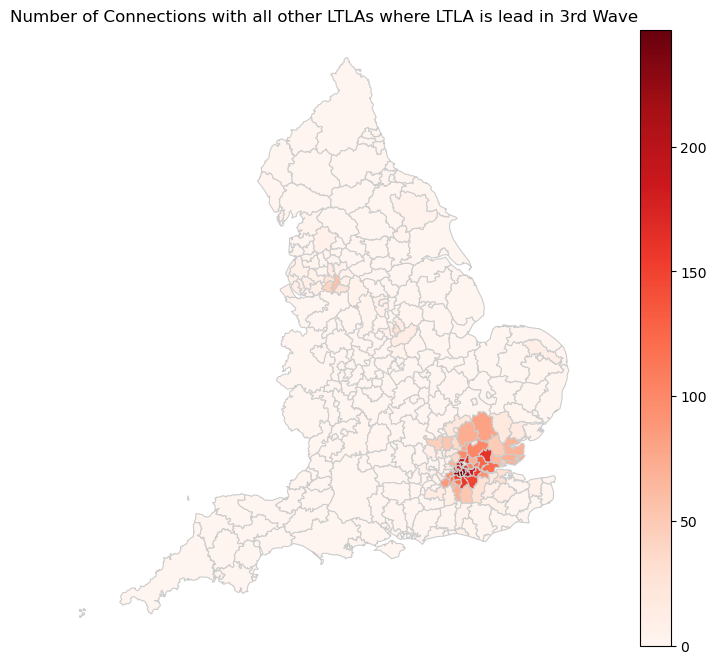

In [510]:
variable = 'Lead count'
vmin, vmax = 0.0, 247.0
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Number of Connections with all other LTLAs where LTLA is lead in 3rd Wave')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_lag3.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

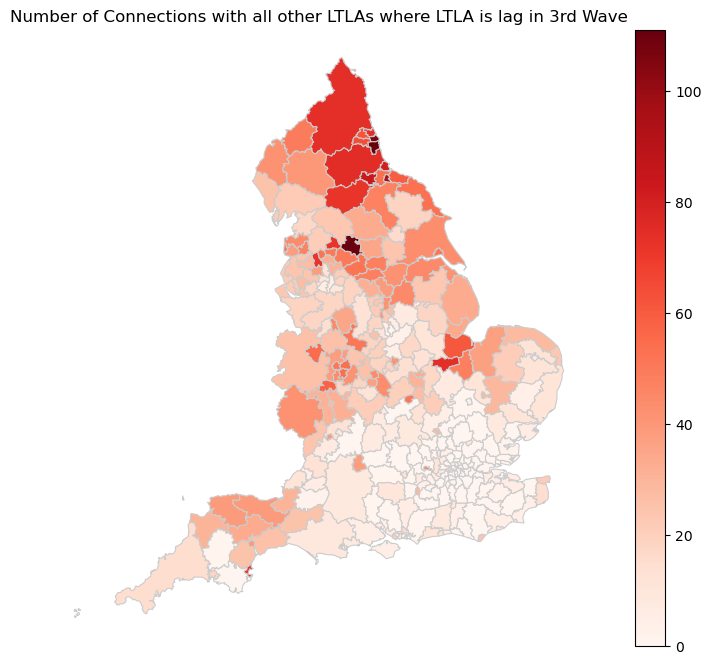

In [512]:
variable = 'Lag count'
vmin, vmax = 0.0, 111.0
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Number of Connections with all other LTLAs where LTLA is lag in 3rd Wave')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_lag3.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

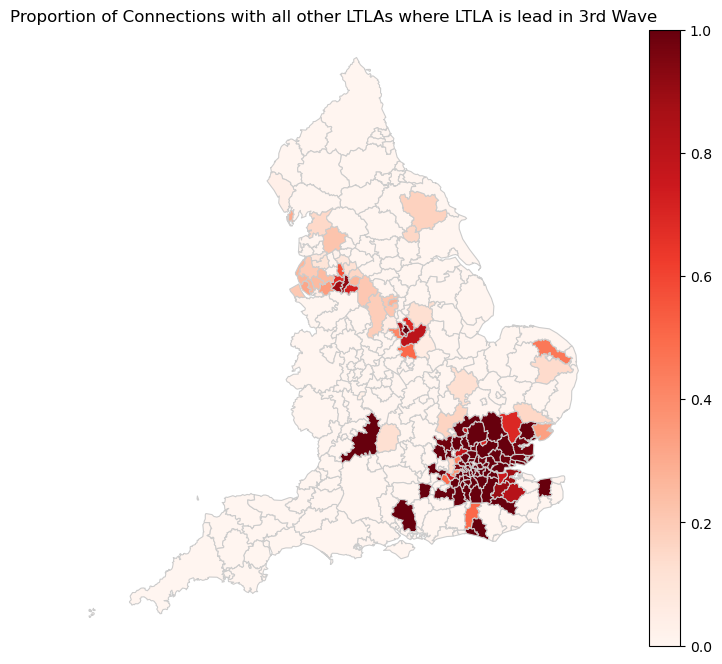

In [513]:
variable = 'Lead/Lag Proportion'
vmin, vmax = 0.0, 1
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Proportion of Connections with all other LTLAs where LTLA is lead in 3rd Wave')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_lag3.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

In [514]:
lead_means3 = lag_notzero3new.groupby(['LTLA 1'])['Maximum Correlation'].mean()
lead_means3 = pd.DataFrame(lead_means3)
lead_means3 = lead_means3.reset_index()

In [515]:
lag_means3 = lag_notzero3new.groupby(['LTLA 2'])['Maximum Correlation'].mean()
lag_means3 = pd.DataFrame(lag_means3)
lag_means3 = lag_means3.reset_index()

In [516]:
map_df_means3 = map_df.merge(lead_means3, how = 'left', left_on='LAD19NM', right_on='LTLA 1')
map_df_means3 = map_df_means3.merge(lag_means3, how = 'left', left_on='LAD19NM', right_on='LTLA 2')

In [517]:
map_df_means3[["Maximum Correlation_x","Maximum Correlation_y"]] = map_df_means3[["Maximum Correlation_x","Maximum Correlation_y"]].fillna(0)

In [522]:
map_df_means3.nlargest(2, 'Maximum Correlation_y')

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,LTLA 1,Maximum Correlation_x,LTLA 2,Maximum Correlation_y
300,E09000017,Hillingdon,NaN,508166,183120,-0.44182,51.5366,3fa22fa5-402f-4b82-8367-05ddb5d0b309,"POLYGON ((503946.104 190047.399, 504132.500 19...",POINT (507929.434 183690.982),Hillingdon,0.858126,Hillingdon,0.893360
288,E09000005,Brent,NaN,519615,186468,-0.27568,51.5644,55a16f82-1966-4989-b832-cc1a42769ca9,"POLYGON ((520113.102 190480.805, 521462.703 18...",POINT (520198.390 185823.543),Brent,0.810758,Brent,0.892352


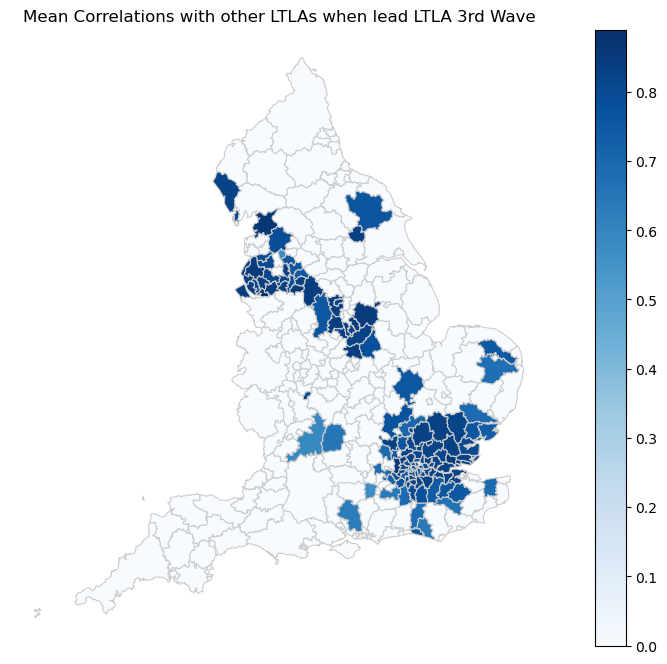

In [521]:
variable = 'Maximum Correlation_x'
vmin, vmax = 0.0, 0.89
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Mean Correlations with other LTLAs when lead LTLA 3rd Wave')
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_means3.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

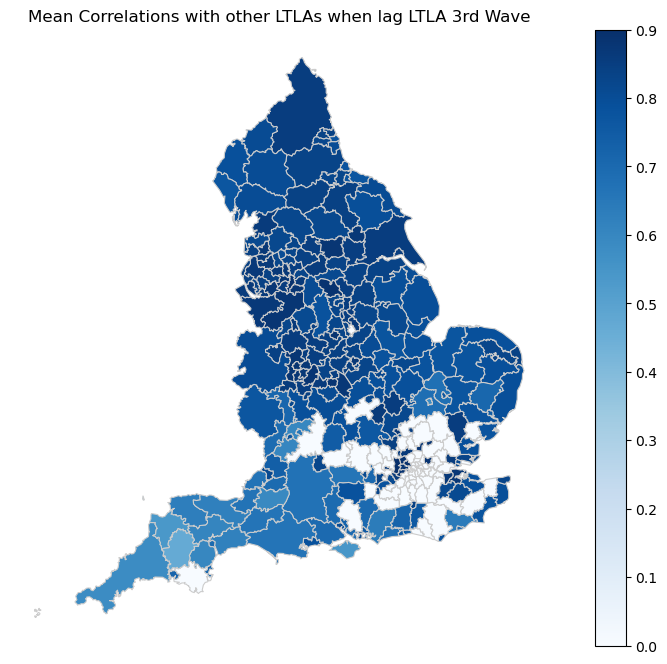

In [523]:
variable = 'Maximum Correlation_y'
vmin, vmax = 0.0, 0.90
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Mean Correlations with other LTLAs when lag LTLA 3rd Wave')
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_means3.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

In [524]:
lead_meanslags3 = lag_notzero3new.groupby(['LTLA 1'])['Lag in Days'].mean()
lead_meanslags3 = pd.DataFrame(lead_meanslags3)
lead_meanslags3 = lead_meanslags3.reset_index()

In [525]:
lag_meanslags3 = lag_notzero3new.groupby(['LTLA 2'])['Lag in Days'].mean()
lag_meanslags3 = pd.DataFrame(lag_meanslags3)
lag_meanslags3 = lag_meanslags3.reset_index()

In [526]:
map_df_meanslags3 = map_df.merge(lead_meanslags3, how = 'left', left_on='LAD19NM', right_on='LTLA 1')
map_df_meanslags3 = map_df_meanslags3.merge(lag_meanslags3, how = 'left', left_on='LAD19NM', right_on='LTLA 2')

In [527]:
map_df_meanslags3[["Lag in Days_x","Lag in Days_y"]] = map_df_meanslags3[["Lag in Days_x","Lag in Days_y"]].fillna(0)

In [531]:
map_df_meanslags3.nlargest(2,'Lag in Days_y')

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,LTLA 1,Lag in Days_x,LTLA 2,Lag in Days_y
60,E07000008,Cambridge,NaN,545420,257901,0.126436,52.2002,737571fa-2526-4f77-8e0b-6924fbba654e,"POLYGON ((547969.602 261792.702, 547274.700 26...",POINT (545895.874 257843.368),NaN,0.0,Cambridge,21.0
86,E07000047,West Devon,NaN,256379,86998,-4.033570,50.6649,54990ef7-4720-4ea1-a876-65e3a2deb5e7,"POLYGON ((235005.403 85575.904, 236645.502 873...",POINT (255524.945 86042.271),NaN,0.0,West Devon,14.0


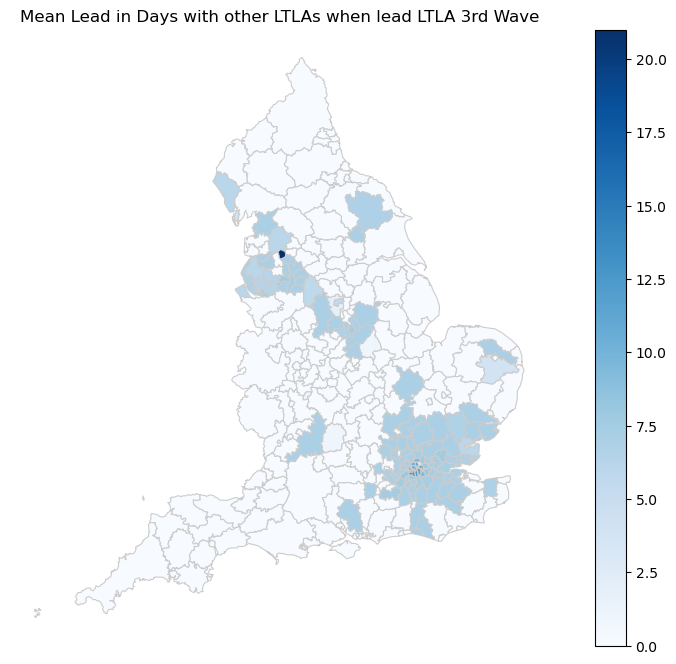

In [530]:
variable = 'Lag in Days_x'
vmin, vmax = 0.0, 21.0
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Mean Lead in Days with other LTLAs when lead LTLA 3rd Wave')
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_meanslags3.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

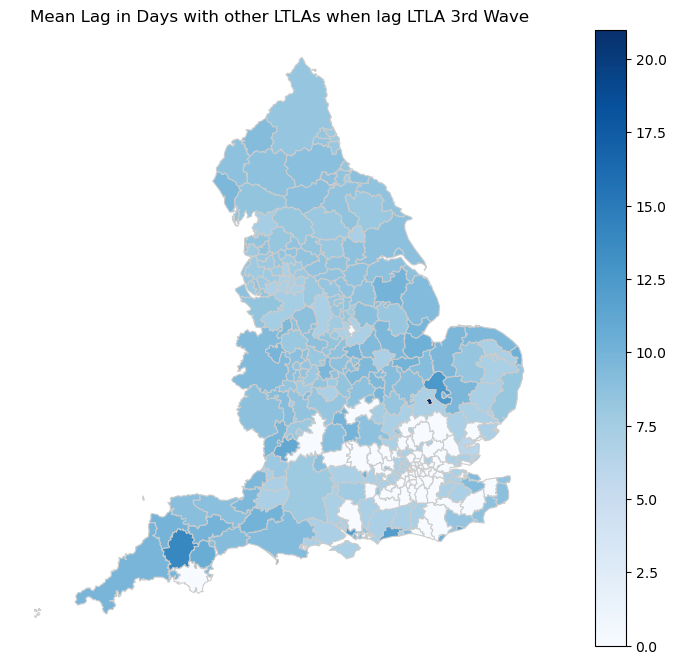

In [532]:
variable = 'Lag in Days_y'
vmin, vmax = 0.0, 21.0
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Mean Lag in Days with other LTLAs when lag LTLA 3rd Wave')
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_meanslags3.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

## 3rd Wave (R Values)

In [533]:
thirdwave_r = pd.read_csv('Third_Wave_R.csv')

In [534]:
thirdwave_r['LTLA 1'] = thirdwave_r['LTLA 1'].replace(['Cornwall and Isles of Scilly'], 'Cornwall')
thirdwave_r['LTLA 2'] = thirdwave_r['LTLA 2'].replace(['Cornwall and Isles of Scilly'], 'Cornwall')

In [535]:
lag_notzero3r = thirdwave_r.loc[thirdwave_r['Lag in Days'] != 0]

In [536]:
lag_notzero3r

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
0,Redcar and Cleveland,East Devon,0.729717,-3.0
1,Redcar and Cleveland,Havant,0.792831,-2.0
2,Redcar and Cleveland,Surrey Heath,0.567554,-2.0
3,Redcar and Cleveland,Worthing,0.642351,-3.0
4,Redcar and Cleveland,Bolton,0.702724,-1.0
...,...,...,...,...
49443,South Hams,Rushcliffe,0.737507,-1.0
49449,Basingstoke and Deane,Tunbridge Wells,0.792406,-1.0
49450,Basingstoke and Deane,Rushcliffe,0.817918,-1.0
49453,Tunbridge Wells,Hillingdon,0.837198,1.0


In [537]:
lag_notzero3r = lag_notzero3r.loc[abs(lag_notzero3r['Lag in Days']) <= 21]

In [539]:
lag_notzero3rrep = lag_notzero3r.drop(columns = ['Maximum Correlation'])

In [540]:
lag_notzero3rnew = lag_direction(lag_notzero3r, lag_notzero3rrep)

/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/1245444803.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['LTLA 1'].iloc[i] = df2['LTLA 2'].iloc[i]
/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/1245444803.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['LTLA 2'].iloc[i] = df2['LTLA 1'].iloc[i]


In [541]:
lag_notzero3rnew['Lag in Days'] = abs(lag_notzero3rnew['Lag in Days'])

/var/folders/5m/nyccnvvs4197vfzljd054r300000gn/T/ipykernel_68847/1581342376.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lag_notzero3rnew['Lag in Days'] = abs(lag_notzero3rnew['Lag in Days'])


In [542]:
lead_counts3r = lag_notzero3rnew['LTLA 1'].value_counts()
lead_counts_df3r = pd.DataFrame(lead_counts3r)
lead_counts_df3r = lead_counts_df3r.reset_index()
lead_counts_df3r = lead_counts_df3r.rename(columns = {'index': 'LTLA 1', 'LTLA 1':'Lead count'})

In [543]:
lag_counts3r = lag_notzero3rnew['LTLA 2'].value_counts()
lag_counts_df3r = pd.DataFrame(lag_counts3r)
lag_counts_df3r = lag_counts_df3r.reset_index()
lag_counts_df3r = lag_counts_df3r.rename(columns = {'index': 'LTLA 2', 'LTLA 2':'Lag count'})

In [544]:
map_df_lag3r = map_df.merge(lead_counts_df3r, how = 'left', left_on='LAD19NM', right_on='LTLA 1')
map_df_lag3r = map_df_lag3r.merge(lag_counts_df3r, how = 'left', left_on='LAD19NM', right_on='LTLA 2')

In [545]:
map_df_lag3r[["Lead count","Lag count"]] = map_df_lag3r[["Lead count","Lag count"]].fillna(0)

In [546]:
map_df_lag3r['Lead/Lag Proportion'] = map_df_lag3r['Lead count'] / (map_df_lag3r['Lead count'] + map_df_lag3r['Lag count'])

In [547]:
map_df_lag3r['Lead/Lag Proportion'] = map_df_lag3r['Lead/Lag Proportion'].fillna(0)

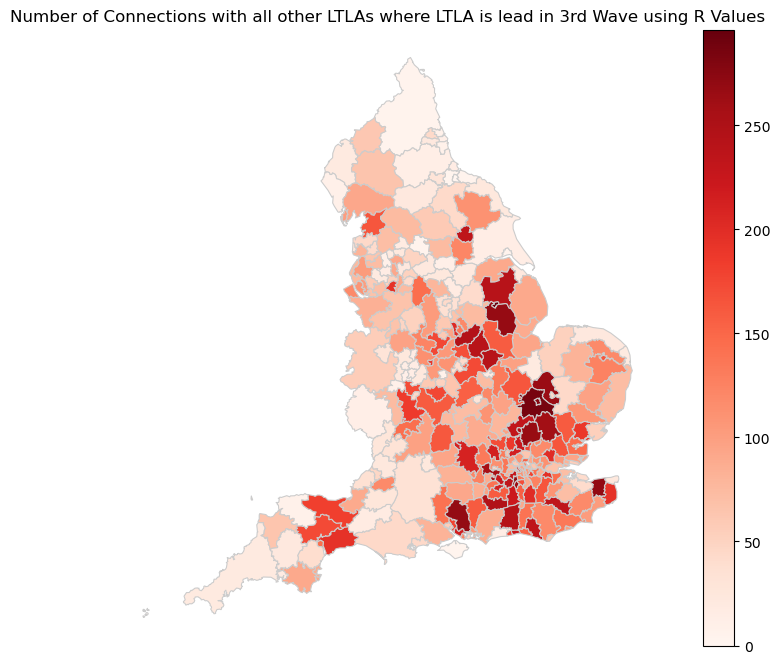

In [549]:
variable = 'Lead count'
vmin, vmax = 0.0, 296.0
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Number of Connections with all other LTLAs where LTLA is lead in 3rd Wave using R Values')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_lag3r.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

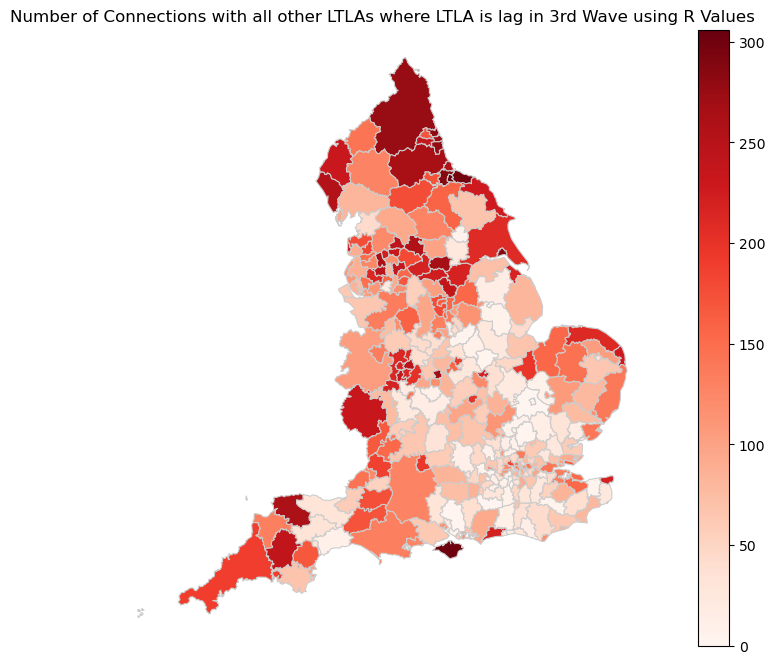

In [551]:
variable = 'Lag count'
vmin, vmax = 0.0, 306.0
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Number of Connections with all other LTLAs where LTLA is lag in 3rd Wave using R Values')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_lag3r.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

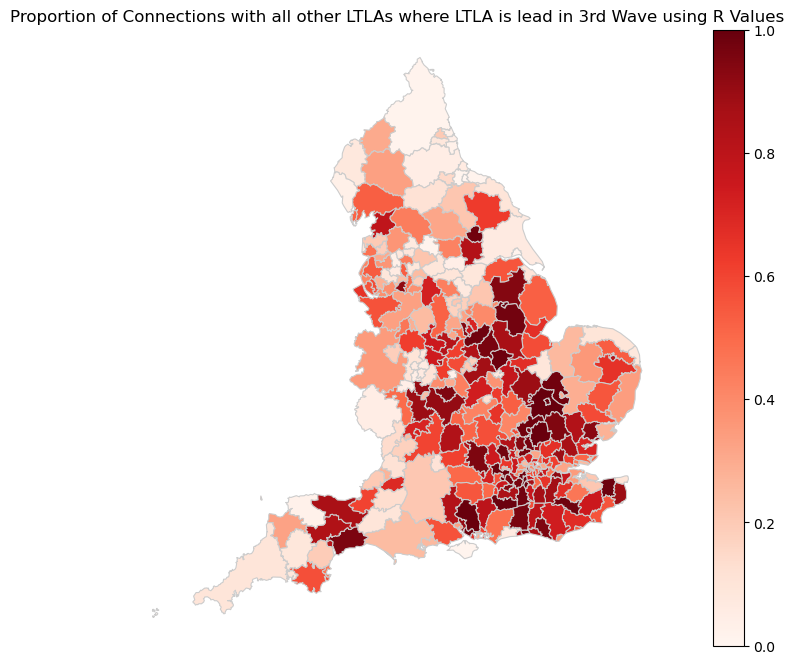

In [552]:
variable = 'Lead/Lag Proportion'
vmin, vmax = 0.0, 1.0
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Proportion of Connections with all other LTLAs where LTLA is lead in 3rd Wave using R Values')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_lag3r.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

In [553]:
lead_meanslags3r = lag_notzero3rnew.groupby(['LTLA 1'])['Lag in Days'].mean()
lead_meanslags3r = pd.DataFrame(lead_meanslags3r)
lead_meanslags3r = lead_meanslags3r.reset_index()

In [554]:
lag_meanslags3r = lag_notzero3rnew.groupby(['LTLA 2'])['Lag in Days'].mean()
lag_meanslags3r = pd.DataFrame(lag_meanslags3r)
lag_meanslags3r = lag_meanslags3r.reset_index()

In [555]:
map_df_meanslags3r = map_df.merge(lead_meanslags3r, how = 'left', left_on='LAD19NM', right_on='LTLA 1')
map_df_meanslags3r = map_df_meanslags3r.merge(lag_meanslags3r, how = 'left', left_on='LAD19NM', right_on='LTLA 2')

In [556]:
map_df_meanslags3r[["Lag in Days_x","Lag in Days_y"]] = map_df_meanslags3r[["Lag in Days_x","Lag in Days_y"]].fillna(0)

In [559]:
map_df_meanslags3r.nlargest(2,'Lag in Days_y')

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,LTLA 1,Lag in Days_x,LTLA 2,Lag in Days_y
1,E06000002,Middlesbrough,NaN,451141,516887,-1.210990,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51...",POINT (450414.504 516716.770),Middlesbrough,1.000000,Middlesbrough,3.885621
60,E07000008,Cambridge,NaN,545420,257901,0.126436,52.2002,737571fa-2526-4f77-8e0b-6924fbba654e,"POLYGON ((547969.602 261792.702, 547274.700 26...",POINT (545895.874 257843.368),Cambridge,2.684783,Cambridge,3.000000


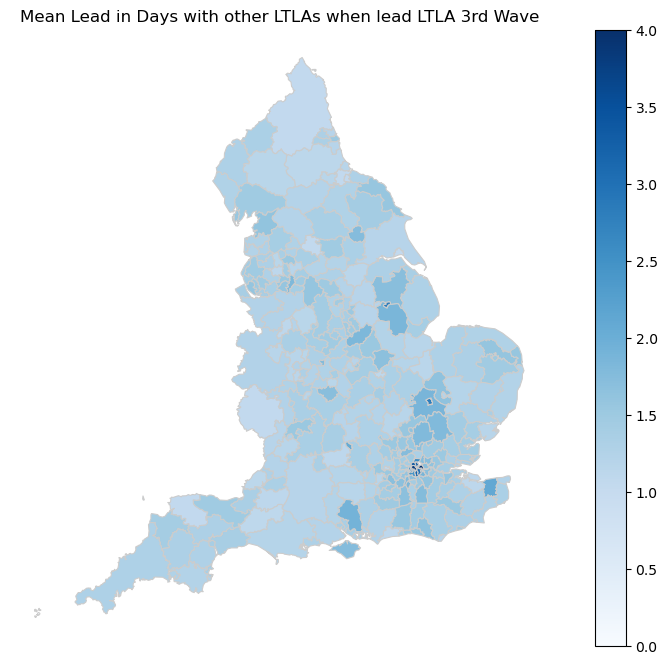

In [558]:
variable = 'Lag in Days_x'
vmin, vmax = 0.0, 4.0
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Mean Lead in Days with other LTLAs when lead LTLA 3rd Wave using R Values')
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_meanslags3r.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

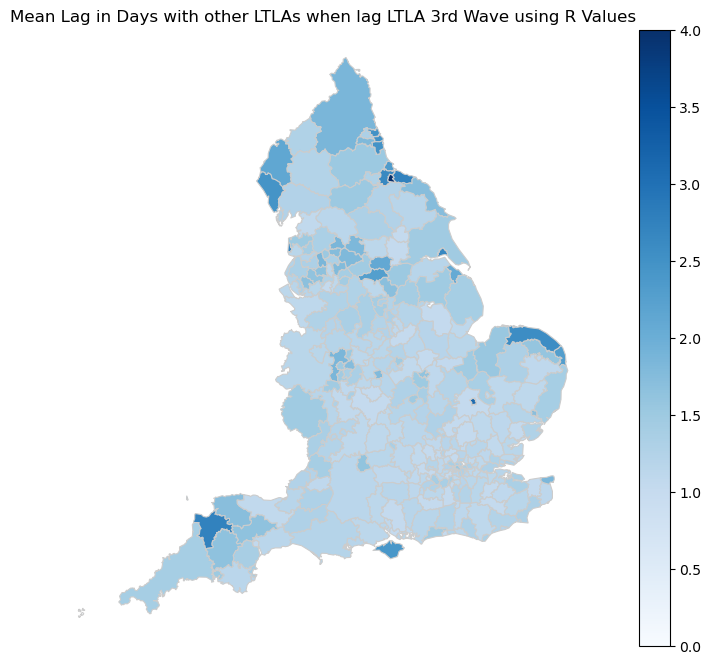

In [560]:
variable = 'Lag in Days_y'
vmin, vmax = 0.0, 4.0
fig, ax = plt.subplots(1, figsize =(12, 8))
ax.axis('off')
ax.set_title('Mean Lag in Days with other LTLAs when lag LTLA 3rd Wave using R Values')
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_meanslags3r.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()